# WRF-based Rainfall Analysis by Block Size

This section loads outputs from the MATLAB WRF analysis (CSV exported alongside the MAT file) in `wrf_rainfall_analysis/` and produces bar plots analogous to the SWMM-based section above:

- Median intensities (historical vs PGW) across durations, stratified by block size.
- Median totals (historical vs PGW), stratified by block size.

Files consumed (MATLAB output):
- `wrf_rainfall_analysis/block_stats_events.csv` — per-event statistics with columns: `measure_type` (intensity/total), `duration_min`, `block_size`, `is_full_domain`, `hist_value`, `pgw_value`, `diff`, `ratio`, `units`.
- `wrf_rainfall_analysis/block_stats_results.mat` — original MATLAB results (not read here; CSV is sufficient).

## Notebook structure

- Setup and data loading
- Helpers: normalization, summary computation, plotting
- Boxplot visualization per block (dual y-axis)
- Compute summary and plot examples
- Statistical tests: Wilcoxon paired; significance grid
- Statistical tests: Pooled permutation (median difference)
- Notes and future work


In [1]:
# Setup: consolidated imports and data loading
from pathlib import Path
from typing import List, Tuple, Dict, Literal, Optional, Union
import re

import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

import seaborn as sns
from math import ceil, sqrt

# Base data directory
base_dir = Path(r"d:/MY_CODES/UrbanRunoffModeling/04_impact_of_climate_change_and_urbanization/wrf_rainfall_analysis")

# Per-event stats exported from MATLAB
df_raw = pd.read_csv(base_dir / "block_stats_events.csv")

# Subset to sub-regional blocks for analysis (domain shown separately if needed)
df = df_raw.copy()

# Build labels and ensure dtypes
df["block_label"] = df["block_size"].astype(str) + "-cell block"
df["duration_min"] = df["duration_min"].astype(int)

# Separate intensity and total measures
intensity = df[df["measure_type"] == "intensity"].copy()
intensity = intensity[intensity.is_full_domain == 0]

# Median across events per duration and block
med_intensity = (
    intensity.groupby(["duration_min", "block_size", "block_label"], as_index=False)
            .agg(hist_median_mm_per_hr=("hist_value", "median"),
                 pgw_median_mm_per_hr=("pgw_value", "median"))
)

# Totals aggregated by block (duration_min == 0)
totals = df[(df["measure_type"] == "total") & (df["is_full_domain"] == 0)].copy()
med_totals = (
    totals.groupby(["block_size", "block_label"], as_index=False)
          .agg(hist_median_mm=("hist_value", "median"),
               pgw_median_mm=("pgw_value", "median"))
)

palette = sns.color_palette("tab10")

def order_blocks(df_like):
    order = (
        df_like.drop_duplicates("block_size")
               .sort_values("block_size", ascending=False)
               ["block_label"].tolist()
    )
    return order

## WRF Rainfall analysis

### Based on matfile pre-analysis

Unconditional analysis

#### Tip: Selecting box sizes to plot
- Size 6 is treated as "rannana basin".
- You can select by number (e.g., 6) and/or by label (e.g., "full domain").
- The plotting functions automatically label subplots (a), (b), … in reading order.

In [2]:
# =============================
# Helpers: normalize, compute, plot
# =============================

# 1) Load CSV path reference (data already loaded above as wrf_rainfall_df if needed)
csv_path = base_dir / "block_stats_events.csv"
wrf_rainfall_df = pd.read_csv(csv_path)

# 2) Configuration
INT_DURS: List[int] = [10, 20, 30, 60, 120, 240, 360, 720, 1440]
INT_DUR_LABELS: List[str] = [f"{d}min" for d in INT_DURS]
TOTAL_LABEL: str = "Total rainfall"

# ============== Normalization helpers ==============
def _normalize_one_block(val: Union[str, int, float]) -> Tuple[float, str]:
    """Parse a 'block_size' cell into (numeric_size, canonical_label)."""
    if pd.isna(val):
        return np.nan, "Unknown"
    s = str(val).strip()
    s_low = s.lower()
    if s_low in {"raanana", "raanana basin", "raanana-basin", "raanana block"}:
        return 6.0, "raanana basin"
    try:
        n = int(float(s))
        return float(n), f"Block size {n}"
    except Exception:
        pass
    m = re.search(r"\d+", s_low)
    if m:
        n = int(m.group(0))
        return float(n), f"Block size {n}"
    return np.nan, s

def normalize_blocks(df: pd.DataFrame) -> pd.DataFrame:
    """Create 'block_size_num' and 'block_label' with preserved 'Raanana Basin' text."""
    d = df.copy()
    d["is_full_domain"] = d.get("is_full_domain", 0).astype(int)

    size_nums: List[float] = []
    labels: List[str] = []

    for raw, is_dom in zip(d.get("block_size", [np.nan] * len(d)), d["is_full_domain"]):
        if is_dom == 1:
            size_nums.append(float("inf"))
            labels.append("Full domain")
            continue

        sn, lab = _normalize_one_block(raw)
        raw_str = str(raw).strip()
        raw_low = raw_str.lower()

        if "raanana basin" in raw_low:
            size_nums.append(float(sn) if np.isfinite(sn) else 6.0)
            labels.append(raw_str)
        else:
            size_nums.append(sn)
            labels.append(lab if np.isfinite(sn) else raw_str)

    d["block_size_num"] = size_nums
    d["block_label"] = labels
    return d

def list_available_boxes(data: pd.DataFrame) -> List[Tuple[Union[int, str], str]]:
    """Return available (key,label) blocks after normalization (largest → smallest)."""
    d = normalize_blocks(data)
    out: List[Tuple[Union[int, str], str]] = []
    sub = d[d["is_full_domain"] == 0]
    uniq = sub[["block_size_num", "block_label"]].drop_duplicates().sort_values("block_size_num", ascending=False)
    for _, row in uniq.iterrows():
        size = row["block_size_num"]
        lab = row["block_label"]
        pretty = "Raanana basin" if lab.lower() == "raanana basin" else ("Full domain" if lab.lower() == "full domain" else lab)
        key: Union[int, str] = int(size) if np.isfinite(size) else pretty
        out.append((key, pretty))
    if (d["is_full_domain"] == 1).any():
        out.append(("Full domain", "Full domain"))
    return out

# ============== Computation helpers ==============
def _eventwise_pct_change(sub: pd.DataFrame) -> np.ndarray:
    """Percent change for paired events; used for 'paired' mode and quantiles."""
    hist = sub["hist_value"].to_numpy(float)
    pgw = sub["pgw_value"].to_numpy(float)
    hist[hist == 0.0] = np.nan
    ev = (pgw - hist) / hist * 100.0
    ev = np.where(np.isfinite(ev), ev, np.nan)
    return ev[~np.isnan(ev)]

def _bootstrap_ratio_of_medians(sub: pd.DataFrame, B: int = 1000, seed: int = 0,
                                ci_low: float = 25.0, ci_high: float = 75.0) -> Tuple[float, float]:
    """Bootstrap percent interval for pooled ratio of medians in percent units."""
    if sub.empty:
        return np.nan, np.nan
    ev_ids = sub["event_id"].unique()
    if ev_ids.size == 0:
        return np.nan, np.nan
    rng = np.random.default_rng(seed)
    boots = np.empty(B, dtype=float)
    for b in range(B):
        sample_ids = rng.choice(ev_ids, size=ev_ids.size, replace=True)
        s = sub[sub["event_id"].isin(sample_ids)]
        med_h = np.nanmedian(s["hist_value"].to_numpy(float))
        med_f = np.nanmedian(s["pgw_value"].to_numpy(float))
        boots[b] = np.nan if med_h == 0 else (med_f - med_h) / med_h * 100.0
    q1 = float(np.nanpercentile(boots, ci_low))
    q3 = float(np.nanpercentile(boots, ci_high))
    return q1, q3

def compute_median_changes(
    data: pd.DataFrame,
    include_full_domain: bool = True,
    mode: Literal["pooled", "paired"] = "pooled",
    iqr_source: Literal["eventwise", "bootstrap"] = "eventwise",
    bootstrap_iters: int = 1000,
    bootstrap_seed: int = 0,
    ci_low: float = 25.0,
    ci_high: float = 75.0,
) -> pd.DataFrame:
    """Build the summary table for plotting (by unique block_label)."""
    if not (0 <= ci_low < ci_high <= 100):
        raise ValueError("ci_low and ci_high must satisfy 0 ≤ ci_low < ci_high ≤ 100")

    d = normalize_blocks(data)
    d["duration_min"] = d["duration_min"].astype(int)

    rows: List[Dict] = []

    non_dom = (
        d[d["is_full_domain"] == 0][["block_label", "block_size_num"]]
        .drop_duplicates()
        .assign(_tie_rank=d["block_label"].str.lower().str.startswith("raanana basin").map({True: 0, False: 1}))
        .sort_values(["block_size_num", "_tie_rank", "block_label"], ascending=[False, True, True])
)

    for _, r in non_dom.iterrows():
        label = r["block_label"]
        size_num = float(r["block_size_num"])
        sub_mask = (d["is_full_domain"] == 0) & (d["block_label"] == label)
        _append_block_rows(
            rows, d[sub_mask], label=label, size_num=size_num,
            mode=mode, iqr_source=iqr_source,
            bootstrap_iters=bootstrap_iters, bootstrap_seed=bootstrap_seed,
            ci_low=ci_low, ci_high=ci_high,
        )

    if include_full_domain and (d["is_full_domain"] == 1).any():
        mask = (d["is_full_domain"] == 1)
        _append_block_rows(
            rows, d[mask], label="Full domain", size_num=float("inf"),
            mode=mode, iqr_source=iqr_source,
            bootstrap_iters=bootstrap_iters, bootstrap_seed=bootstrap_seed,
            ci_low=ci_low, ci_high=ci_high,
        )

    out = pd.DataFrame(rows)
    out["duration_order"] = out["duration_min"].apply(lambda x: INT_DURS.index(x) if x in INT_DURS else len(INT_DURS))
    out = out.sort_values(["block_size_num", "duration_order", "block_label"], ascending=[False, True, True]).reset_index(drop=True)

    # Store CI meta for downstream reference
    out["ci_low"] = ci_low
    out["ci_high"] = ci_high
    out["mode"] = mode
    out["iqr_source"] = iqr_source
    return out

def _center_and_iqr_for_subset(sub: pd.DataFrame, mode: str, iqr_source: str,
                               bootstrap_iters: int, bootstrap_seed: int,
                               ci_low: float, ci_high: float) -> Tuple[float, float, float, float, float]:
    """Return (median_hist, median_pgw, percent_change, q_low, q_high)."""
    if sub.empty:
        return np.nan, np.nan, np.nan, np.nan, np.nan
    med_h = float(np.nanmedian(sub["hist_value"].to_numpy(float)))
    med_f = float(np.nanmedian(sub["pgw_value"].to_numpy(float)))
    if mode == "pooled":
        center = np.nan if med_h == 0 else (med_f - med_h) / med_h * 100.0
    elif mode == "paired":
        ev = _eventwise_pct_change(sub)
        center = np.nan if ev.size == 0 else float(np.nanmedian(ev))
    else:
        raise ValueError("mode must be 'pooled' or 'paired'")
    if iqr_source == "eventwise":
        ev = _eventwise_pct_change(sub)
        if ev.size == 0:
            q1 = q3 = np.nan
        else:
            q1 = float(np.nanpercentile(ev, ci_low))
            q3 = float(np.nanpercentile(ev, ci_high))
    elif iqr_source == "bootstrap":
        if mode == "pooled":
            q1, q3 = _bootstrap_ratio_of_medians(sub, B=bootstrap_iters, seed=bootstrap_seed,
                                                 ci_low=ci_low, ci_high=ci_high)
        else:
            ev = _eventwise_pct_change(sub)
            if ev.size == 0:
                q1 = q3 = np.nan
            else:
                q1 = float(np.nanpercentile(ev, ci_low))
                q3 = float(np.nanpercentile(ev, ci_high))
    else:
        raise ValueError("iqr_source must be 'eventwise' or 'bootstrap'")
    return med_h, med_f, float(center), q1, q3

def _append_block_rows(rows: List[Dict], block_df: pd.DataFrame, label: str, size_num: float,
                       mode: str, iqr_source: str, bootstrap_iters: int, bootstrap_seed: int,
                       ci_low: float, ci_high: float) -> None:
    """Append rows for all durations and the total cell for a given block."""
    for dur, lab in zip(INT_DURS, INT_DUR_LABELS):
        sub = block_df[(block_df["measure_type"] == "intensity") & (block_df["duration_min"] == dur)]
        med_h, med_f, pct, q1, q3 = _center_and_iqr_for_subset(sub, mode, iqr_source, bootstrap_iters, bootstrap_seed, ci_low, ci_high)
        rows.append({
            "block_label": label, "block_size_num": size_num, "measure": "intensity",
            "duration_min": dur, "duration_label": lab,
            "median_hist": med_h, "median_pgw": med_f,
            "pct_change": pct, "q1": q1, "q3": q3
        })
    sub_t = block_df[(block_df["measure_type"] == "total") & (block_df["duration_min"] == 0)]
    med_h_t, med_f_t, pct_t, q1_t, q3_t = _center_and_iqr_for_subset(sub_t, mode, iqr_source, bootstrap_iters, bootstrap_seed, ci_low, ci_high)
    rows.append({
        "block_label": label, "block_size_num": size_num, "measure": "total",
        "duration_min": 0, "duration_label": TOTAL_LABEL,
        "median_hist": med_h_t, "median_pgw": med_f_t,
        "pct_change": pct_t, "q1": q1_t, "q3": q3_t
    })

# ============== Plotting helpers ==============
SUBPLOT_LABEL_FONT = {"fontsize": 14, "fontweight": "bold"}
def _pretty_title(label: str) -> str:
    # Keep the exact label as-is (no auto-lowercasing or renaming)
    return label.strip()
# increase internal spacing to prevent overlaps
def _compute_x_positions(n: int) -> np.ndarray:
    x = np.arange(n, dtype=float)
    if n >= 2:
        x[-1] = x[-2] + 1.6  # slightly more gap before Total
    return x

def _apply_panel_styling(ax: plt.Axes, vlim: float) -> None:
    yticks = np.arange(-vlim, vlim + 0.1, 5)
    ax.set_yticks(yticks)
    ax.set_yticklabels([f"{int(t)}%" for t in yticks])
    ax.grid(axis="y", which="major", linestyle="-", alpha=0.35)


def _add_total_separator(ax: plt.Axes, bars: mpl.container.BarContainer) -> None:
    rects = bars.patches if hasattr(bars, 'patches') else []
    if not rects:
        return
    x_centers = [r.get_x() + r.get_width() / 2.0 for r in rects]
    if len(x_centers) >= 2:
        x_sep = 0.5 * (x_centers[-2] + x_centers[-1])
        ax.axvline(x_sep, color='black', linestyle='--', linewidth=0.8, alpha=0.5)


def _labels_from_choices(mode: str, iqr_source: str, ci_low: float = 25.0, ci_high: float = 75.0) -> str:
    mode_map = {"pooled": "Center pooled", "paired": "Center paired"}
    iqr_map = {"eventwise": "IQR eventwise", "bootstrap": "IQR bootstrap"}
    return f"{mode_map.get(mode, mode)} · {iqr_map.get(iqr_source, iqr_source)} {ci_low}–{ci_high}%"

# --- Scientific titles mapping ---
def _panel_scientific_title(block_label: str,
                            areal_label: str = "Spatial mean ",
                            local_label: str = "Local maxima (3×3)") -> Tuple[str, str]:
    lbl = str(block_label).strip()
    low = lbl.lower()
    if "raanana basin" in low:
        scale = "Catchment scale"
    else:
        scale = "Regional scale"
    is_local = ("3 pixel" in low) or ("3×3" in low) or (low == "block size 3")
    sub = local_label if is_local else areal_label
    return scale, sub

# Draw row group titles after layout, with extra padding
def _add_row_group_titles(fig: plt.Figure, axes: List[plt.Axes], ncols: int,
                          titles_by_panel: List[Tuple[str, str]],
                          y_pad: float = 0.08) -> None:
    n_panels = len(titles_by_panel)
    if n_panels == 0:
        return
    nrows = int(np.ceil(n_panels / ncols))
    axes_arr = np.atleast_1d(axes)

    for r in range(nrows):
        i0 = r * ncols
        i1 = min((r + 1) * ncols, n_panels)
        if i0 >= i1:
            continue
        row_scales = {titles_by_panel[i][0] for i in range(i0, i1)}
        if len(row_scales) != 1:
            continue
        row_axes = [axes_arr[i] for i in range(i0, min(i1, len(axes_arr)))]
        if not row_axes:
            continue
        left = min(ax.get_position().x0 for ax in row_axes)
        right = max(ax.get_position().x1 for ax in row_axes)
        y_top = max(ax.get_position().y1 for ax in row_axes) + y_pad
        fig.text((left + right) / 2.0, y_top, list(row_scales)[0],
                 ha="center", va="bottom", fontsize=14, fontweight="bold",
                 transform=fig.transFigure)

# Shared labels + colorbar; increase bottom/top margins

def _finish_layout_with_colorbar(fig: plt.Figure, axes: List[plt.Axes],
                                 norm: mpl.colors.Normalize, cmap: mpl.colors.Colormap,
                                 title: str, caption: str) -> None:
    fig.supylabel("Median difference [%]\n$\\frac{\\mathrm{future}-\\mathrm{historical}}{\\mathrm{historical}}$", x=0.02)
    fig.supxlabel("Duration", y=0.06)
    # looser rect to give room for row group titles and panel titles
    fig.tight_layout(rect=[0.05, 0.14, 0.98, 0.88])
    cax = fig.add_axes([0.15, 0.01, 0.70, 0.025])
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    cbar = fig.colorbar(sm, cax=cax, orientation="horizontal")
    cbar.set_label("Change [%]")

# ============== Plot functions ==============
def _make_panel_data(summary_block: pd.DataFrame) -> Tuple[List[str], List[float], List[float], List[float]]:
    x_labels = INT_DUR_LABELS + [TOTAL_LABEL]
    y_vals: List[float] = []
    q1_vals: List[float] = []
    q3_vals: List[float] = []
    for dur in INT_DURS:
        mask = (summary_block["measure"] == "intensity") & (summary_block["duration_min"] == dur)
        y = summary_block.loc[mask, "pct_change"].values
        q1 = summary_block.loc[mask, "q1"].values
        q3 = summary_block.loc[mask, "q3"].values
        y_vals.append(float(y[0]) if len(y) else np.nan)
        q1_vals.append(float(q1[0]) if len(q1) else np.nan)
        q3_vals.append(float(q3[0]) if len(q3) else np.nan)
    mask_t = (summary_block["measure"] == "total") & (summary_block["duration_min"] == 0)
    y_t = summary_block.loc[mask_t, "pct_change"].values
    q1_t = summary_block.loc[mask_t, "q1"].values
    q3_t = summary_block.loc[mask_t, "q3"].values
    y_vals.append(float(y_t[0]) if len(y_t) else np.nan)
    q1_vals.append(float(q1_t[0]) if len(q1_t) else np.nan)
    q3_vals.append(float(q3_t[0]) if len(q3_t) else np.nan)
    return x_labels, y_vals, q1_vals, q3_vals

def _resolve_selection_labels(summary: pd.DataFrame, select_blocks: List[Union[int, str]]) -> List[str]:
    labels: List[str] = []
    uniq = summary["block_label"].unique().tolist()
    uniq_map = {lbl.lower(): lbl for lbl in uniq}
    for sel in select_blocks:
        if isinstance(sel, (int, float)) and np.isfinite(sel):
            if int(sel) == 6:
                key = "raanana basin"
                if key in uniq_map and uniq_map[key] not in labels:
                    labels.append(uniq_map[key])
            else:
                key = f"block size {int(sel)}"
                if key in uniq_map and uniq_map[key] not in labels:
                    labels.append(uniq_map[key])
        elif isinstance(sel, str):
            s = sel.strip().lower()
            if s in uniq_map and uniq_map[s] not in labels:
                labels.append(uniq_map[s])
            elif s in {"full", "domain", "full domain"}:
                key = "full domain"
                if key in uniq_map and uniq_map[key] not in labels:
                    labels.append(uniq_map[key])
    return labels

def plot_changes_subplots(
    summary: pd.DataFrame,
    mode: str,
    iqr_source: str,
    ncols: int = 2,
    vlim: float = 30.0,
    figure_name: str = "Figure 1",
    select_blocks: Optional[List[Union[int, str]]] = None,
    add_subplot_labels: bool = True,
    dpi: int = 600
) -> None:
    if select_blocks:
        ordered_labels = _resolve_selection_labels(summary, select_blocks)
    else:
        ordered_labels = summary.sort_values("block_size_num", ascending=False)["block_label"].unique().tolist()
    n_panels = len(ordered_labels)
    if n_panels == 0:
        print("No matching blocks to plot.")
        return
    ncols = min(ncols, n_panels)
    nrows = int(np.ceil(n_panels / ncols))
    norm = TwoSlopeNorm(vmin=-vlim, vcenter=0.0, vmax=vlim)
    cmap = mpl.cm.get_cmap("RdBu_r")
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3.8 * ncols, 6.0 * nrows), sharey=True, dpi=dpi)
    axes = np.atleast_1d(axes).ravel()
    for i, label in enumerate(ordered_labels):
        ax = axes[i]
        sub = summary[summary["block_label"] == label]
        x_labels, y_vals, _, _ = _make_panel_data(sub)
        colors = [cmap(norm(v)) if np.isfinite(v) else (0.85, 0.85, 0.85, 1.0) for v in y_vals]
        x_pos = _compute_x_positions(len(x_labels))
        bars = ax.bar(x_pos, y_vals, color=colors, edgecolor="black", linewidth=0.6)
        ax.axhline(0, color="black", linestyle="--", linewidth=0.8)
        ax.set_title(_pretty_title(label))
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_labels, rotation=35)
        _apply_panel_styling(ax, vlim)
        _add_total_separator(ax, bars)
        if add_subplot_labels:
            label_char = chr(ord('a') + i)
            ax.text(-0.12, 1.05, f"({label_char})", transform=ax.transAxes, **SUBPLOT_LABEL_FONT)
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)
    caption = _labels_from_choices(mode, iqr_source)
    _finish_layout_with_colorbar(fig, axes.tolist(), norm, cmap, title=f"{figure_name}", caption=caption)
    plt.show()


def plot_changes_subplots_with_iqr(
    summary: pd.DataFrame,
    mode: str,
    iqr_source: str,
    ncols: int = 2,
    vlim: float = 30.0,
    figure_name: str = "Figure 2",
    select_blocks: Optional[List[Union[int, str]]] = None,
    add_subplot_labels: bool = True,
    dpi: int = 600
) -> None:
    if select_blocks:
        ordered_labels = _resolve_selection_labels(summary, select_blocks)
    else:
        ordered_labels = summary.sort_values("block_size_num", ascending=False)["block_label"].unique().tolist()
    n_panels = len(ordered_labels)
    if n_panels == 0:
        print("No matching blocks to plot.")
        return
    ncols = min(ncols, n_panels)
    nrows = int(np.ceil(n_panels / ncols))
    norm = TwoSlopeNorm(vmin=-vlim, vcenter=0.0, vmax=vlim)
    cmap = mpl.cm.get_cmap("RdBu_r")
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3.8 * ncols, 6.0 * nrows), sharey=True, dpi=dpi)
    axes = np.atleast_1d(axes).ravel()
    for i, label in enumerate(ordered_labels):
        ax = axes[i]
        sub = summary[summary["block_label"] == label]
        x_labels, y_vals, q1_vals, q3_vals = _make_panel_data(sub)
        colors = [cmap(norm(v)) if np.isfinite(v) else (0.85, 0.85, 0.85, 1.0) for v in y_vals]
        x_pos = _compute_x_positions(len(x_labels))
        bars = ax.bar(x_pos, y_vals, color=colors, edgecolor="black", linewidth=0.6)
        lower = []
        upper = []
        for y, q1, q3 in zip(y_vals, q1_vals, q3_vals):
            if np.isfinite(y) and np.isfinite(q1) and np.isfinite(q3):
                lower.append(abs(y - q1))
                upper.append(abs(q3 - y))
            else:
                lower.append(np.nan)
                upper.append(np.nan)
        yerr = np.array([lower, upper])
        x_centers = [rect.get_x() + rect.get_width() / 2.0 for rect in bars]
        ax.errorbar(x_centers, y_vals, yerr=yerr, fmt="none", ecolor="black", elinewidth=1.0, capsize=3)
        ax.axhline(0, color="black", linestyle="--", linewidth=0.8)
        ax.set_title(_pretty_title(label))
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_labels, rotation=35)
        _apply_panel_styling(ax, vlim)
        _add_total_separator(ax, bars)
        if add_subplot_labels:
            label_char = chr(ord('a') + i)
            ax.text(-0.12, 1.05, f"({label_char})", transform=ax.transAxes, **SUBPLOT_LABEL_FONT)
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)
    caption = _labels_from_choices(mode, iqr_source)
    _finish_layout_with_colorbar(fig, axes.tolist(), norm, cmap, title=f"{figure_name}", caption=caption)
    plt.show()

## Helpers and plotting API

Utilities to normalize labels, compute summary tables, and draw the change panels.

In [3]:
# Boxplot visualization utilities (imports consolidated in the first cell)
from math import ceil, sqrt

def plot_boxplots_by_block_dual_y(df: pd.DataFrame,
                                  block_col: str = "block_size",
                                  dur_col: str = "duration_min",
                                  hist_col: str = "hist_value",
                                  pgw_col: str = "pgw_value",
                                  diff_col: str = "diff",
                                  figsize_per_panel: float = 4.0):
    """
    Grid of subplots by block_size.
    X axis: duration_min where 0 means total rainfall (mm) and >0 are intensities (mm/hr).
    For each duration draw three boxes: hist_value, pgw_value, diff.
    Two Y axes per subplot:
      Left Y for intensities (durations > 0)
      Right Y for total rainfall (duration == 0)
    Total group is placed at the far right of the x axis.
    """

    required = {block_col, dur_col, hist_col, pgw_col, diff_col}
    missing = [c for c in required if c not in df.columns]
    if missing:
        raise ValueError(f"Missing required columns: {missing}")

    # Blocks
    blocks = sorted(pd.unique(df[block_col].dropna()))
    if len(blocks) == 0:
        raise ValueError("No block sizes found after dropping NaNs.")

    # Durations with 0 moved to the end
    dur_vals = sorted(pd.unique(df[dur_col].dropna()))
    durs_nonzero = [d for d in dur_vals if d != 0]
    durs = durs_nonzero + ([0] if 0 in dur_vals else [])
    xtick_labels = [str(int(d)) for d in durs_nonzero] + (["Total"] if 0 in dur_vals else [])

    # Subplot grid
    n = len(blocks)
    ncols = ceil(sqrt(n))
    nrows = ceil(n / ncols)

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(figsize_per_panel * ncols, figsize_per_panel * nrows),
        sharex=False, sharey=False
    )
    if n == 1:
        axes = np.array([[axes]])
    axes = np.array(axes).reshape(nrows, ncols)

    # Colors and labels (three only)
    colors_triplet = ["#4C78A8", "#72B7B2", "#E45756"]  # hist, pgw, diff
    labels_triplet = ["hist_value", "pgw_value", "diff"]

    box_width = 0.22
    offsets = [-box_width * 1.2, 0.0, box_width * 1.2]

    for idx, block in enumerate(blocks):
        r = idx // ncols
        c = idx % ncols
        ax_left = axes[r, c]
        ax_right = ax_left.twinx()

        df_block = df[df[block_col] == block]

        # Positions per duration in the new order (Total at the end)
        base_positions = {dur: i + 1 for i, dur in enumerate(durs)}

        left_data, left_positions, left_colors = [], [], []
        right_data, right_positions, right_colors = [], [], []

        for dur in durs:
            df_bd = df_block[df_block[dur_col] == dur]
            triplets = [
                pd.to_numeric(df_bd[hist_col], errors="coerce").dropna().to_numpy(),
                pd.to_numeric(df_bd[pgw_col], errors="coerce").dropna().to_numpy(),
                pd.to_numeric(df_bd[diff_col], errors="coerce").dropna().to_numpy(),
            ]
            for k, arr in enumerate(triplets):
                if arr.size == 0:
                    continue
                pos = base_positions[dur] + offsets[k]
                if dur == 0:
                    right_data.append(arr)
                    right_positions.append(pos)
                    right_colors.append(colors_triplet[k])
                else:
                    left_data.append(arr)
                    left_positions.append(pos)
                    left_colors.append(colors_triplet[k])

        # Draw left axis boxes
        if left_data:
            bp_left = ax_left.boxplot(
                left_data,
                positions=left_positions,
                widths=box_width,
                patch_artist=True,
                manage_ticks=False,
                showfliers=False
            )
            for patch, col in zip(bp_left["boxes"], left_colors):
                patch.set_facecolor(col); patch.set_edgecolor("black")
            for line in (*bp_left["whiskers"], *bp_left["caps"], *bp_left["medians"]):
                line.set_color("black")

        # Draw right axis boxes
        if right_data:
            bp_right = ax_right.boxplot(
                right_data,
                positions=right_positions,
                widths=box_width,
                patch_artist=True,
                manage_ticks=False,
                showfliers=False
            )
            for patch, col in zip(bp_right["boxes"], right_colors):
                patch.set_facecolor(col); patch.set_edgecolor("black")
            for line in (*bp_right["whiskers"], *bp_right["caps"], *bp_right["medians"]):
                line.set_color("black")

        # X ticks and labels
        ax_left.set_xticks([base_positions[d] for d in durs])
        ax_left.set_xticklabels(xtick_labels)

        # Title and labels
        title_txt = "Full domain" if block == 0 else f"block_size = {block}"
        ax_left.set_title(title_txt, pad=10)
        ax_left.set_xlabel("duration_min  0 = Total")
        if c == 0:
            ax_left.set_ylabel("Intensity mm hr")
        ax_right.set_ylabel("Total mm")

        # Grid and autoscale
        ax_left.grid(axis="y", alpha=0.3)

        if left_data:
            y_left = np.concatenate(left_data)
            ymin, ymax = np.nanmin(y_left), np.nanmax(y_left)
            pad = (ymax - ymin) * 0.05 if ymax != ymin else (1.0 if ymax == 0 else abs(ymax) * 0.05)
            ax_left.set_ylim(ymin - pad, ymax + pad)

        if right_data:
            y_right = np.concatenate(right_data)
            ymin, ymax = np.nanmin(y_right), np.nanmax(y_right)
            pad = (ymax - ymin) * 0.05 if ymax != ymin else (1.0 if ymax == 0 else abs(ymax) * 0.05)
            ax_right.set_ylim(ymin - pad, ymax + pad)

    # Remove empty axes if grid larger than needed
    for k in range(n, nrows * ncols):
        r = k // ncols
        c = k % ncols
        fig.delaxes(axes[r, c])

    # Legend with three entries only
    import matplotlib.patches as mpatches
    legend_patches = [
        mpatches.Patch(facecolor=colors_triplet[0], edgecolor="black", label=labels_triplet[0]),
        mpatches.Patch(facecolor=colors_triplet[1], edgecolor="black", label=labels_triplet[1]),
        mpatches.Patch(facecolor=colors_triplet[2], edgecolor="black", label=labels_triplet[2]),
    ]
    fig.legend(handles=legend_patches, loc="upper center", ncol=3, frameon=False)

    fig.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# Usage
# plot_boxplots_by_block_dual_y(wrf_rainfall_df)

## Boxplots by block (dual y-axis)

Shows distributions of intensities (mm/hr, left y) and total rainfall (mm, right y) per block.

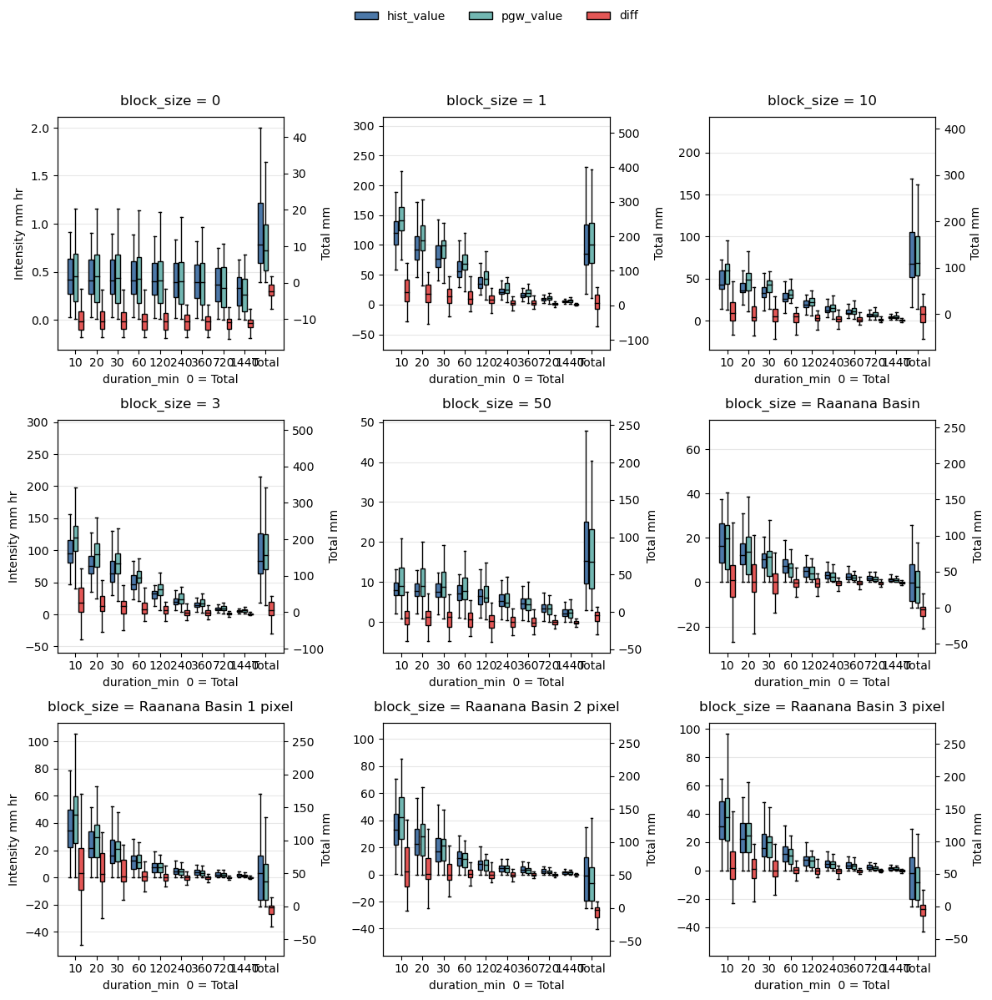

In [4]:
plot_boxplots_by_block_dual_y(wrf_rainfall_df)


In [5]:
# Redefine plotting functions with improved spacing, wider figure, and larger fonts (titles, labels, ticks, colorbar)

# Font size configuration for this cell
TITLE_FONTSIZE = 18
TICK_FONTSIZE = 14
SUPLABEL_FONTSIZE = 18
CB_LABEL_FONTSIZE = 16
CB_TICK_FONTSIZE = 14

# Make subplot label (a,b,c,...) a bit larger
SUBPLOT_LABEL_FONT = {"fontsize": 18, "fontweight": "bold"}

# Override shared layout helper locally to control label fonts and colorbar sizing

# def _finish_layout_with_colorbar(fig: plt.Figure, axes: List[plt.Axes],
#                                  norm: mpl.colors.Normalize, cmap: mpl.colors.Colormap,
#                                  title: str, caption: str) -> None:
#     fig.supylabel("Median difference [%]\n$\\frac{\\mathrm{future}-\\mathrm{historical}}{\\mathrm{historical}}$", x=0.02, fontsize=SUPLABEL_FONTSIZE)
#     fig.supxlabel("Duration", y=0.06, fontsize=SUPLABEL_FONTSIZE)
#     # Reserve a bit more space top/bottom to avoid overlaps with group titles and colorbar
#     fig.tight_layout(rect=[0.05, 0.19, 0.98, 0.86])
#     # Lower the colorbar further to create more clearance from bottom x labels
#     cax = fig.add_axes([0.13, 0.000, 0.74, 0.025])
#     sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
#     cbar = fig.colorbar(sm, cax=cax, orientation="horizontal")
#     cbar.set_label("Change [%]", fontsize=CB_LABEL_FONTSIZE)
#     cbar.ax.tick_params(labelsize=CB_TICK_FONTSIZE)


def plot_changes_selected_subplots(
    summary: pd.DataFrame,
    mode: str,
    iqr_source: str,
    ncols: int = 2,
    vlim: float = 30.0,
    figure_name: str = "Figure 1",
    select_blocks: Optional[List[Union[int, str]]] = None,
    add_subplot_labels: bool = True,
    dpi: int = 600,
    use_scientific_titles: bool = True,
    areal_label: str = "Spatial mean ",
    local_label: str = "Local maxima (3×3)",
    add_row_group_titles: bool = True,
    group_titles_mode: Literal['row','inline','none'] = 'row',
    ci_low: float = 25.0,
    ci_high: float = 75.0,
) -> None:
    if select_blocks:
        ordered_labels = _resolve_selection_labels(summary, select_blocks)
    else:
        ordered_labels = summary.sort_values("block_size_num", ascending=False)["block_label"].unique().tolist()

    n_panels = len(ordered_labels)
    if n_panels == 0:
        return

    ncols = min(ncols, n_panels)
    nrows = int(np.ceil(n_panels / ncols))

    norm = TwoSlopeNorm(vmin=-vlim, vcenter=0.0, vmax=vlim)
    cmap = mpl.cm.get_cmap("RdBu_r")

    # Wider per-column figure and explicit vertical spacing between rows
    fig, axes = plt.subplots(
        nrows=nrows, ncols=ncols,
        figsize=(6.2 * ncols, 7.6 * nrows),
        sharey=True, dpi=dpi,
        gridspec_kw={"hspace": 0.55}
    )
    fig.subplots_adjust(hspace=0.55)

    axes = np.atleast_1d(axes).ravel()

    titles_by_panel: List[Tuple[str, str]] = []

    for i, raw_label in enumerate(ordered_labels):
        ax = axes[i]
        sub = summary[summary["block_label"] == raw_label]
        x_labels, y_vals, _, _ = _make_panel_data(sub)
        colors = [cmap(norm(v)) if np.isfinite(v) else (0.85, 0.85, 0.85, 1.0) for v in y_vals]
        x_pos = _compute_x_positions(len(x_labels))
        bars = ax.bar(x_pos, y_vals, color=colors, edgecolor="black", linewidth=0.6)
        ax.axhline(0, color="black", linestyle="--", linewidth=0.8)

        if use_scientific_titles:
            scale, sub_title = _panel_scientific_title(raw_label, areal_label=areal_label, local_label=local_label)
            title_txt = f"{scale}: {sub_title}" if group_titles_mode == 'inline' else sub_title
            # Larger title font, tighter pad
            ax.set_title(title_txt, pad=8, fontsize=TITLE_FONTSIZE)
            titles_by_panel.append((scale, sub_title))
        else:
            ax.set_title(str(raw_label).strip(), pad=8, fontsize=TITLE_FONTSIZE)

        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_labels, rotation=35, fontsize=TICK_FONTSIZE)
        ax.tick_params(axis="y", labelsize=TICK_FONTSIZE)
        _apply_panel_styling(ax, vlim)
        _add_total_separator(ax, bars)

        if add_subplot_labels:
            label_char = chr(ord('a') + i)
            ax.text(0, 1.05, f"({label_char})", transform=ax.transAxes, **SUBPLOT_LABEL_FONT)

    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    caption = _labels_from_choices(mode, iqr_source, ci_low, ci_high)
    _finish_layout_with_colorbar(fig, axes.tolist(), norm, cmap, title=f"{figure_name}", caption=caption)

    if add_row_group_titles and group_titles_mode == 'row':
        # Smaller gap between group titles and the row
        _add_row_group_titles(fig, axes.tolist(), ncols, titles_by_panel, y_pad=0.03)

    plt.show()


def plot_changes_selected_subplots_with_iqr(
    summary: pd.DataFrame,
    mode: str,
    iqr_source: str,
    ncols: int = 2,
    vlim: float = 30.0,
    figure_name: str = "Figure 2",
    select_blocks: Optional[List[Union[int, str]]] = None,
    add_subplot_labels: bool = True,
    dpi: int = 600,
    use_scientific_titles: bool = True,
    areal_label: str = "Spatial mean ",
    local_label: str = "Local maxima (3×3)",
    add_row_group_titles: bool = True,
    group_titles_mode: Literal['row','inline','none'] = 'row',
    ci_low: float = 25.0,
    ci_high: float = 75.0,
) -> None:
    if select_blocks:
        ordered_labels = _resolve_selection_labels(summary, select_blocks)
    else:
        ordered_labels = summary.sort_values("block_size_num", ascending=False)["block_label"].unique().tolist()

    n_panels = len(ordered_labels)
    if n_panels == 0:
        return

    ncols = min(ncols, n_panels)
    nrows = int(np.ceil(n_panels / ncols))

    norm = TwoSlopeNorm(vmin=-vlim, vcenter=0.0, vmax=vlim)
    cmap = mpl.cm.get_cmap("RdBu_r")

    # Wider per-column figure and explicit vertical spacing between rows
    fig, axes = plt.subplots(
        nrows=nrows, ncols=ncols,
        figsize=(6.2 * ncols, 7.6 * nrows),
        sharey=True, dpi=dpi,
        gridspec_kw={"hspace": 0.55}
    )
    fig.subplots_adjust(hspace=0.55)

    axes = np.atleast_1d(axes).ravel()

    titles_by_panel: List[Tuple[str, str]] = []

    for i, raw_label in enumerate(ordered_labels):
        ax = axes[i]
        sub = summary[summary["block_label"] == raw_label]
        x_labels, y_vals, q1_vals, q3_vals = _make_panel_data(sub)
        colors = [cmap(norm(v)) if np.isfinite(v) else (0.85, 0.85, 0.85, 1.0) for v in y_vals]
        x_pos = _compute_x_positions(len(x_labels))
        bars = ax.bar(x_pos, y_vals, color=colors, edgecolor="black", linewidth=0.6)

        # Robust asymmetric error bars only for finite entries
        lower, upper, x_centers_valid, y_vals_valid = [], [], [], []
        rects = list(bars)
        for rect, y, q1, q3 in zip(rects, y_vals, q1_vals, q3_vals):
            if np.isfinite(y) and np.isfinite(q1) and np.isfinite(q3):
                x_c = rect.get_x() + rect.get_width() / 2.0
                x_centers_valid.append(x_c)
                y_vals_valid.append(y)
                lower.append(max(0.0, y - q1))
                upper.append(max(0.0, q3 - y))
        if x_centers_valid:
            yerr = np.array([lower, upper], dtype=float)
            ax.errorbar(x_centers_valid, y_vals_valid, yerr=yerr, fmt="none",
                        ecolor="black", elinewidth=1.0, capsize=3, zorder=3)

        ax.axhline(0, color="black", linestyle="--", linewidth=0.8)

        if use_scientific_titles:
            scale, sub_title = _panel_scientific_title(raw_label, areal_label=areal_label, local_label=local_label)
            title_txt = f"{scale}: {sub_title}" if group_titles_mode == 'inline' else sub_title
            ax.set_title(title_txt, pad=8, fontsize=TITLE_FONTSIZE)
            titles_by_panel.append((scale, sub_title))
        else:
            ax.set_title(str(raw_label).strip(), pad=8, fontsize=TITLE_FONTSIZE)

        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_labels, rotation=35, fontsize=TICK_FONTSIZE)
        ax.tick_params(axis="y", labelsize=TICK_FONTSIZE)
        _apply_panel_styling(ax, vlim)
        _add_total_separator(ax, bars)

        if add_subplot_labels:
            label_char = chr(ord('a') + i)
            ax.text(0, 1.05, f"({label_char})", transform=ax.transAxes, **SUBPLOT_LABEL_FONT)

    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    caption = _labels_from_choices(mode, iqr_source, ci_low, ci_high)
    _finish_layout_with_colorbar(fig, axes.tolist(), norm, cmap, title=f"{figure_name}", caption=caption)

    if add_row_group_titles and group_titles_mode == 'row':
        _add_row_group_titles(fig, axes.tolist(), ncols, titles_by_panel, y_pad=0.03)

    plt.show()

In [6]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

from pathlib import Path
from typing import Optional, List, Union, Tuple
from typing import Literal  # for type hint of group_titles_mode

# Assumes the following helpers/constants are defined elsewhere:
# _resolve_selection_labels, _make_panel_data, _compute_x_positions
# _apply_panel_styling, _add_total_separator
# _panel_scientific_title, _labels_from_choices, _add_row_group_titles
# TITLE_FONTSIZE, TICK_FONTSIZE, SUBPLOT_LABEL_FONT

# Fixed two color scheme (no gradient, no colorbar)
NEG_COLOR = "#1E3A5F"                 # negative changes (safer)
POS_COLOR = "#7B1121"                 # positive changes (riskier)
ZERO_COLOR = (0.85, 0.85, 0.85, 1.0)  # neutral for zero or missing

# Default figure output directory
DEFAULT_FIG_DIR = Path(
    r"D:\Development\RESEARCH\Documents\Papers\urban_runoff_response_to_hpes\Nature\Figures"
)


def _save_or_show_figure(
    fig: mpl.figure.Figure,
    filename: Optional[str],
    dpi: int,
    save_dir: Path = DEFAULT_FIG_DIR,
    file_format: str = "pdf",
    show: bool = True,
) -> None:
    """
    Save the figure if a filename is provided, and optionally show it.

    Parameters
    ----------
    fig : mpl.figure.Figure
        Figure object to save and or show.
    filename : str or None
        Base filename without extension. If None, the figure is not saved.
    dpi : int
        Resolution for saving.
    save_dir : Path
        Directory where the figure will be saved.
    file_format : str
        File extension such as 'png' or 'pdf'.
    show : bool
        If True, display the figure. If False, close without showing.
    """
    if filename is not None:
        save_dir.mkdir(parents=True, exist_ok=True)
        out_path = save_dir / f"{filename}.{file_format}"
        fig.savefig(out_path, dpi=dpi, bbox_inches="tight")

    if show:
        plt.show()
    else:
        plt.close(fig)


def plot_changes_selected_subplots(
    summary: pd.DataFrame,
    mode: str,
    iqr_source: str,
    ncols: int = 2,
    vlim: float = 30.0,
    select_blocks: Optional[List[Union[int, str]]] = None,
    add_subplot_labels: bool = True,
    dpi: int = 600,
    use_scientific_titles: bool = True,
    areal_label: str = "Spatial mean ",
    local_label: str = "Local maxima (3×3)",
    add_row_group_titles: bool = True,
    group_titles_mode: Literal["row", "inline", "none"] = "row",
    ci_low: float = 25.0,
    ci_high: float = 75.0,
    ylabel: str = "Change (%)",
    filename: Optional[str] = None,
    show: bool = True,
    save_dir: Path = DEFAULT_FIG_DIR,
    file_format: str = "pdf",
) -> None:
    """
    Multi panel barplots of median changes (no IQR bars).

    Uses only two fill colors based on the sign of the change:
        POS_COLOR for positive values
        NEG_COLOR for negative values
        ZERO_COLOR for exactly zero or non finite values

    No colorbar and no continuous colormap.

    Parameters
    ----------
    summary : pd.DataFrame
        Summary table with one row per bar.
    mode : str
        Kept for consistency with upstream workflow.
    iqr_source : str
        Kept for consistency with upstream workflow.
    ncols : int
        Number of columns in the subplot grid.
    vlim : float
        Symmetric y limit for all panels.
    select_blocks : list or None
        Subset of block labels to plot, in desired order.
    add_subplot_labels : bool
        If True, add (a), (b), etc in each panel.
    dpi : int
        Figure resolution.
    use_scientific_titles : bool
        If True, use _panel_scientific_title helper.
    areal_label, local_label : str
        Passed to _panel_scientific_title.
    add_row_group_titles : bool
        If True, call _add_row_group_titles for grouped row headers.
    group_titles_mode : {"row","inline","none"}
        Controls how scale information is displayed.
    ci_low, ci_high : float
        Not used directly here but kept for interface consistency.
    ylabel : str
        Label for the y axis.
    filename : str or None
        Base filename for saving. If None, figure is not saved.
    show : bool
        If True, show the plot. If False, do not show.
    save_dir : Path
        Directory where the figure is saved when filename is given.
    file_format : str
        File extension such as 'png' or 'pdf'.
    """

    # Determine which blocks to plot
    if select_blocks:
        ordered_labels = _resolve_selection_labels(summary, select_blocks)
    else:
        ordered_labels = (
            summary.sort_values("block_size_num", ascending=False)["block_label"]
            .unique()
            .tolist()
        )

    n_panels = len(ordered_labels)
    if n_panels == 0:
        return

    # Subplot layout
    ncols = min(ncols, n_panels)
    nrows = int(np.ceil(n_panels / ncols))

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(6.2 * ncols, 7.6 * nrows),
        sharey=True,
        dpi=dpi,
        gridspec_kw={"hspace": 0.55},
    )
    fig.subplots_adjust(hspace=0.55)

    axes = np.atleast_1d(axes).ravel()
    titles_by_panel: List[Tuple[str, str]] = []

    for i, raw_label in enumerate(ordered_labels):
        ax = axes[i]
        sub = summary[summary["block_label"] == raw_label]

        x_labels, y_vals, _, _ = _make_panel_data(sub)
        x_pos = _compute_x_positions(len(x_labels))

        # Two color mapping by sign
        colors = []
        for v in y_vals:
            if not np.isfinite(v):
                colors.append(ZERO_COLOR)
            elif v > 0:
                colors.append(POS_COLOR)
            elif v < 0:
                colors.append(NEG_COLOR)
            else:
                colors.append(ZERO_COLOR)

        bars = ax.bar(
            x_pos,
            y_vals,
            color=colors,
            edgecolor="black",
            linewidth=0.6,
        )

        # Horizontal zero line
        ax.axhline(0, color="black", linestyle="--", linewidth=0.8)

        # Panel titles
        if use_scientific_titles:
            scale, sub_title = _panel_scientific_title(
                raw_label,
                areal_label=areal_label,
                local_label=local_label,
            )
            if group_titles_mode == "inline":
                title_txt = f"{scale}: {sub_title}"
            else:
                title_txt = sub_title
            ax.set_title(title_txt, pad=8, fontsize=TITLE_FONTSIZE)
            titles_by_panel.append((scale, sub_title))
        else:
            ax.set_title(str(raw_label).strip(), pad=8, fontsize=TITLE_FONTSIZE)

        # X axis ticks and labels
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_labels, rotation=35, fontsize=TICK_FONTSIZE)

        # Y axis label and ticks
        if i % ncols == 0:
            ax.set_ylabel(ylabel, fontsize=TICK_FONTSIZE)
        ax.tick_params(axis="y", labelsize=TICK_FONTSIZE)

        # Panel styling
        _apply_panel_styling(ax, vlim)
        _add_total_separator(ax, bars)

        # Subplot labels: (a), (b), …
        if add_subplot_labels:
            label_char = chr(ord("a") + i)
            ax.text(
                0,
                1.05,
                f"({label_char})",
                transform=ax.transAxes,
                **SUBPLOT_LABEL_FONT,
            )

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    # Optional row group titles
    if add_row_group_titles and group_titles_mode == "row":
        _add_row_group_titles(
            fig,
            axes.tolist(),
            ncols,
            titles_by_panel,
            y_pad=0.03,
        )

    _save_or_show_figure(
        fig=fig,
        filename=filename,
        dpi=dpi,
        save_dir=save_dir,
        file_format=file_format,
        show=show,
    )


def plot_changes_selected_subplots_with_iqr(
    summary: pd.DataFrame,
    mode: str,
    iqr_source: str,
    ncols: int = 2,
    vlim: float = 30.0,
    select_blocks: Optional[List[Union[int, str]]] = None,
    add_subplot_labels: bool = True,
    dpi: int = 600,
    use_scientific_titles: bool = True,
    areal_label: str = "Spatial mean ",
    local_label: str = "Local maxima (3×3)",
    add_row_group_titles: bool = True,
    group_titles_mode: Literal["row", "inline", "none"] = "row",
    ci_low: float = 25.0,
    ci_high: float = 75.0,
    ylabel: str = "Change (%)",
    filename: Optional[str] = None,
    show: bool = True,
    save_dir: Path = DEFAULT_FIG_DIR,
    file_format: str = "pdf",
) -> None:
    """
    Multi panel barplots of median changes with asymmetric IQR error bars.

    Uses only two fill colors based on the sign of the median change:
        POS_COLOR for positive values
        NEG_COLOR for negative values
        ZERO_COLOR for exactly zero or non finite values

    No colorbar and no continuous colormap.
    """

    # Determine which blocks to plot
    if select_blocks:
        ordered_labels = _resolve_selection_labels(summary, select_blocks)
    else:
        ordered_labels = (
            summary.sort_values("block_size_num", ascending=False)["block_label"]
            .unique()
            .tolist()
        )

    n_panels = len(ordered_labels)
    if n_panels == 0:
        return

    # Layout
    ncols = min(ncols, n_panels)
    nrows = int(np.ceil(n_panels / ncols))

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(6.2 * ncols, 7.6 * nrows),
        sharey=True,
        dpi=dpi,
        gridspec_kw={"hspace": 0.55},
    )
    fig.subplots_adjust(hspace=0.55)

    axes = np.atleast_1d(axes).ravel()
    titles_by_panel: List[Tuple[str, str]] = []

    # Loop over panels
    for i, raw_label in enumerate(ordered_labels):
        ax = axes[i]
        sub = summary[summary["block_label"] == raw_label]

        x_labels, y_vals, q1_vals, q3_vals = _make_panel_data(sub)
        x_pos = _compute_x_positions(len(x_labels))

        # Two color mapping by sign of median value
        colors = []
        for v in y_vals:
            if not np.isfinite(v):
                colors.append(ZERO_COLOR)
            elif v > 0:
                colors.append(POS_COLOR)
            elif v < 0:
                colors.append(NEG_COLOR)
            else:
                colors.append(ZERO_COLOR)

        bars = ax.bar(
            x_pos,
            y_vals,
            color=colors,
            edgecolor="black",
            linewidth=0.6,
        )

        # Asymmetric IQR error bars
        lower, upper, x_centers_valid, y_vals_valid = [], [], [], []
        for rect, y, q1, q3 in zip(bars, y_vals, q1_vals, q3_vals):
            if np.isfinite(y) and np.isfinite(q1) and np.isfinite(q3):
                x_c = rect.get_x() + rect.get_width() / 2.0
                x_centers_valid.append(x_c)
                y_vals_valid.append(y)
                lower.append(max(0.0, y - q1))
                upper.append(max(0.0, q3 - y))

        if x_centers_valid:
            yerr = np.array([lower, upper], dtype=float)
            ax.errorbar(
                x_centers_valid,
                y_vals_valid,
                yerr=yerr,
                fmt="none",
                ecolor="black",
                elinewidth=1.0,
                capsize=3,
                zorder=3,
            )

        # Horizontal zero line
        ax.axhline(0, color="black", linestyle="--", linewidth=0.8)

        # Panel titles
        if use_scientific_titles:
            scale, sub_title = _panel_scientific_title(
                raw_label,
                areal_label=areal_label,
                local_label=local_label,
            )
            if group_titles_mode == "inline":
                title_txt = f"{scale}: {sub_title}"
            else:
                title_txt = sub_title
            ax.set_title(title_txt, pad=8, fontsize=TITLE_FONTSIZE)
            titles_by_panel.append((scale, sub_title))
        else:
            ax.set_title(str(raw_label).strip(), pad=8, fontsize=TITLE_FONTSIZE)

        # X axis ticks and labels
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_labels, rotation=35, fontsize=TICK_FONTSIZE)

        # Y axis label and ticks
        if i % ncols == 0:
            ax.set_ylabel(ylabel, fontsize=TICK_FONTSIZE)
        ax.tick_params(axis="y", labelsize=TICK_FONTSIZE)

        # Panel styling
        _apply_panel_styling(ax, vlim)
        _add_total_separator(ax, bars)

        # Subplot labels: (a), (b), …
        if add_subplot_labels:
            label_char = chr(ord("a") + i)
            ax.text(
                0,
                1.05,
                f"({label_char})",
                transform=ax.transAxes,
                **SUBPLOT_LABEL_FONT,
            )

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    # Caption text (currently not drawn but kept for future use)
    caption = _labels_from_choices(mode, iqr_source, ci_low, ci_high)

    # Optional grouped row titles
    if add_row_group_titles and group_titles_mode == "row":
        _add_row_group_titles(
            fig,
            axes.tolist(),
            ncols,
            titles_by_panel,
            y_pad=0.03,
        )

    _save_or_show_figure(
        fig=fig,
        filename=filename,
        dpi=dpi,
        save_dir=save_dir,
        file_format=file_format,
        show=show,
    )

## Compute pooled and paired summary df



In [7]:
CI_LOW = 25.0  # e.g., 10 for 10th percentile
CI_HIGH = 75.0 # e.g., 90 for 90th percentile


summary_pooled = compute_median_changes(
    wrf_rainfall_df,
    include_full_domain=True,
    mode="pooled",
    iqr_source="bootstrap",
    bootstrap_iters=1000,
    bootstrap_seed=42,
    ci_low=CI_LOW,
    ci_high=CI_HIGH,
)

summary_paired = compute_median_changes(
    wrf_rainfall_df,
    include_full_domain=True,
    mode="paired",
    iqr_source="eventwise",
    bootstrap_iters=1000,
    bootstrap_seed=42,
    ci_low=CI_LOW,
    ci_high=CI_HIGH,
)

selected_blocks = [
    "full domain",
    "Block size 3",
    "raanana basin",
    "Raanana Basin 3 pixel",
]

### plot pooled

In [8]:
plot_changes_selected_subplots(
    summary_pooled,
    mode="pooled",
    iqr_source="bootstrap",
    ncols=2,
    vlim=30.0,
    select_blocks=selected_blocks,
    add_subplot_labels=True,
    dpi=600,
    use_scientific_titles=True,
    areal_label="Spatial mean ",
    local_label="Local maxima",
    add_row_group_titles=True,
    ylabel="Median change in maximal rainfall intensity (%)",
    filename="Fig_2",
    show=True,
)

plot_changes_selected_subplots_with_iqr(
    summary_pooled,
    mode="pooled",
    iqr_source="bootstrap",
    ncols=2,
    vlim=30.0,
    select_blocks=selected_blocks,
    add_subplot_labels=True,
    dpi=600,
    use_scientific_titles=True,
    areal_label="Spatial mean ",
    local_label="Local maxima",
    add_row_group_titles=True,
    ylabel="Median change in maximal rainfall intensity (%)",
    filename="Fig_2_error_bars",
    show=True,
)

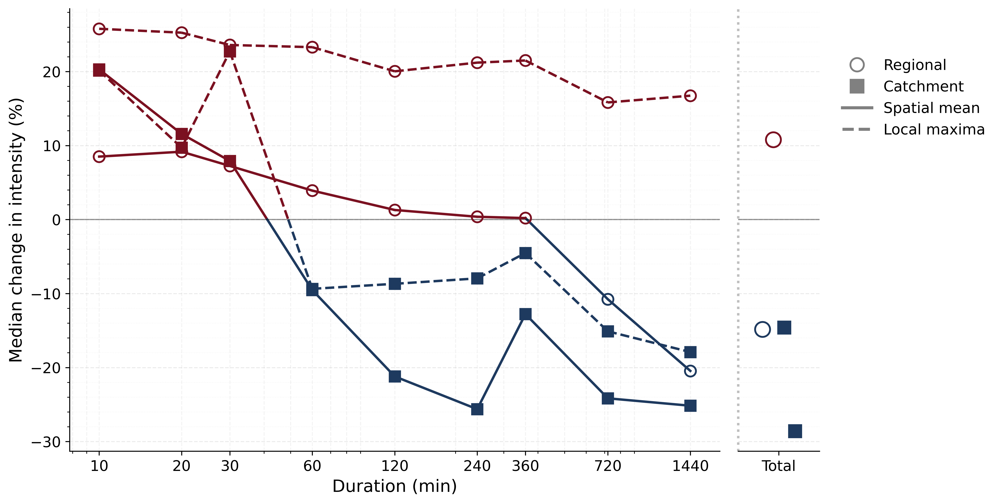

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import AutoMinorLocator
from matplotlib.lines import Line2D
import re
from typing import Optional, List, Union
from pathlib import Path

# --- Constants for Coloring ---
NEG_COLOR = "#1E3A5F"  # Dark Blue (for negative values)
POS_COLOR = "#7B1121"  # Dark Red (for positive values)

# Defining font sizes explicitly for readability
TICK_FONTSIZE = 12
LABEL_FONTSIZE = 14

def parse_duration_label(label: str) -> Optional[float]:
    """Parses duration label string into numeric minutes."""
    label_str = str(label).lower()
    if "total" in label_str: return None
    match = re.search(r"(\d+)", label_str)
    if not match: return None
    val = int(match.group(1))
    if "hr" in label_str or "hour" in label_str: return val * 60
    return val

def get_style_for_label(label: str):
    """Determines marker shape and linestyle based on label text."""
    l = label.lower()
    # Scale -> Marker
    if "basin" in l: marker = 's'  # Square for Catchment
    else: marker = 'o'  # Circle for Regional
        
    # Aggregation -> LineStyle
    if "3" in l or "pixel" in l or "max" in l: linestyle = '--' # Dashed for Local Maxima
    else: linestyle = '-'  # Solid for Spatial Mean
    return marker, linestyle

def plot_split_line(ax, x, y, marker, linestyle, linewidth=2):
    """Plots a line split by color at y=0, with larger, potentially empty markers."""
    x = np.array(x)
    y = np.array(y)
    
    # 1. Draw the lines (split by color)
    for i in range(len(x) - 1):
        x1, x2 = x[i], x[i+1]
        y1, y2 = y[i], y[i+1]
        c1 = POS_COLOR if y1 >= 0 else NEG_COLOR
        c2 = POS_COLOR if y2 >= 0 else NEG_COLOR
        
        if (y1 >= 0 and y2 >= 0) or (y1 < 0 and y2 < 0):
            ax.plot([x1, x2], [y1, y2], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=2)
        else:
            ratio = abs(y1) / (abs(y1) + abs(y2))
            log_x1, log_x2 = np.log10(x1), np.log10(x2)
            log_x_zero = log_x1 + ratio * (log_x2 - log_x1)
            x_zero = 10**log_x_zero
            ax.plot([x1, x_zero], [y1, 0], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=2)
            ax.plot([x_zero, x2], [0, y2], color=c2, linestyle=linestyle, linewidth=linewidth, zorder=2)

    # 2. Draw the markers on top
    MARKER_SIZE = 9
    
    for xi, yi in zip(x, y):
        c = POS_COLOR if yi >= 0 else NEG_COLOR
        
        # Logic for empty vs filled markers
        if marker == 'o': # Regional -> Empty Circle
            ax.plot(xi, yi, marker=marker, color=c, markerfacecolor='none', markeredgecolor=c, markeredgewidth=1.5, markersize=MARKER_SIZE, zorder=3)
        else: # Catchment -> Filled Square
            ax.plot(xi, yi, marker=marker, color=c, markersize=MARKER_SIZE, zorder=3)

def plot_trend_final_clean_fonts(
    summary: pd.DataFrame,
    select_blocks: List[Union[int, str]],
    ylabel: str = "Median change in intensity (%)",
    filename: Optional[str] = None,
    show: bool = True,
    save_dir: Path = DEFAULT_FIG_DIR,
    file_format: str = "pdf",
    dpi: int = 600,
) -> None:
    
    ordered_labels = _resolve_selection_labels(summary, select_blocks)
    if not ordered_labels:
        print("No blocks selected.")
        return

    # --- Calculate Offsets for Total Points ---
    n_series = len(ordered_labels)
    total_x_offsets = np.linspace(-0.2, 0.2, n_series)

    # --- Setup Figure Layout ---
    fig, (ax_main, ax_total) = plt.subplots(
        1, 2, 
        figsize=(11, 6), 
        dpi=dpi, 
        sharey=True,
        gridspec_kw={'width_ratios': [8, 1], 'wspace': 0.05}
    )

    all_x_numerics = set()

    # --- Main Plotting Loop ---
    for i, raw_label in enumerate(ordered_labels):
        sub = summary[summary["block_label"] == raw_label]
        x_labels, y_vals, _, _ = _make_panel_data(sub)
        if len(y_vals) == 0: continue
            
        durations_x, durations_y = [], []
        total_y = None
        for lbl, val in zip(x_labels, y_vals):
            numeric_mins = parse_duration_label(lbl)
            if numeric_mins is not None:
                durations_x.append(numeric_mins)
                durations_y.append(val)
                all_x_numerics.add(numeric_mins)
            elif "total" in str(lbl).lower():
                total_y = val
        
        marker, linestyle = get_style_for_label(raw_label)
        
        # Plot Durations
        if durations_x:
            plot_split_line(ax_main, durations_x, durations_y, marker, linestyle)
        
        # Plot Total point (with offset)
        if total_y is not None:
            c_total = POS_COLOR if total_y >= 0 else NEG_COLOR
            SCATTER_SIZE = 150 
            
            x_pos = total_x_offsets[i]
            
            if marker == 'o': # Empty for Regional
                 ax_total.scatter([x_pos], [total_y], facecolors='none', edgecolors=c_total, marker=marker, s=SCATTER_SIZE, zorder=5, linewidth=1.5)
            else: # Filled for Catchment
                 ax_total.scatter([x_pos], [total_y], color=c_total, marker=marker, s=SCATTER_SIZE, zorder=5, edgecolor='white', linewidth=0.8)

    # --- Axes & Grid Configuration ---
    ax_main.set_xscale('log')
    sorted_ticks = sorted(list(all_x_numerics))
    ax_main.set_xticks(sorted_ticks)
    ax_main.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
    
    # Grid
    ax_main.grid(True, which='both', axis='x', linestyle='--', linewidth=0.8, alpha=0.15)
    ax_main.yaxis.set_minor_locator(AutoMinorLocator(5))
    ax_main.grid(True, which='major', axis='y', linestyle='--', linewidth=0.8, alpha=0.25)
    ax_main.grid(True, which='minor', axis='y', linestyle=':', linewidth=0.5, alpha=0.15)
    
    # Fonts and Labels
    ax_main.set_xticklabels(sorted_ticks, fontsize=TICK_FONTSIZE)
    # Ensure Axis Titles match in size and style
    ax_main.set_xlabel("Duration (min)", fontsize=LABEL_FONTSIZE)
    ax_main.set_ylabel(ylabel, fontsize=LABEL_FONTSIZE)
    ax_main.tick_params(axis='y', labelsize=TICK_FONTSIZE)

    # Total Axis Config
    ax_total.set_xlim(-0.5, 0.5)
    ax_total.set_xticks([0])
    # "Total" label: Normal weight (not bold), same size as ticks
    ax_total.set_xticklabels(["Total"], fontsize=TICK_FONTSIZE, fontweight='normal')
    
    ax_total.tick_params(axis='y', left=False, which='both')
    ax_total.grid(True, which='major', axis='y', linestyle='--', linewidth=0.8, alpha=0.25)
    ax_total.grid(True, which='minor', axis='y', linestyle=':', linewidth=0.5, alpha=0.15)
    ax_total.axvline(-0.5, color='gray', linestyle=':', linewidth=2, clip_on=False, alpha=0.5)
    
    # Clean Spines & Zero Line
    ax_main.spines['right'].set_visible(False)
    ax_main.spines['top'].set_visible(False)
    ax_total.spines['left'].set_visible(False)
    ax_total.spines['top'].set_visible(False)
    ax_total.spines['right'].set_visible(False)
    ax_main.axhline(0, color='black', linewidth=1, alpha=0.4)
    ax_total.axhline(0, color='black', linewidth=1, alpha=0.4)

    # --- Legend Polish ---
    LEGEND_MARKER_SIZE = 11 
    
    h_reg = Line2D([0], [0], color='w', marker='o', markerfacecolor='none', markeredgecolor='gray', markeredgewidth=1.5, markersize=LEGEND_MARKER_SIZE, label='Regional')
    h_cat = Line2D([0], [0], color='w', marker='s', markerfacecolor='gray', markeredgecolor='gray', markersize=LEGEND_MARKER_SIZE, label='Catchment')
    h_mean = Line2D([0], [0], color='gray', linestyle='-', linewidth=2.5, label='Spatial mean')
    h_max = Line2D([0], [0], color='gray', linestyle='--', linewidth=2.5, label='Local maxima')

    fig.legend(
        handles=[h_reg, h_cat, h_mean, h_max], 
        loc='upper left', 
        bbox_to_anchor=(0.91, 0.88),
        frameon=False,
        fontsize=TICK_FONTSIZE
    )
    
    # Adjust layout - Top is now cleaner without title
    plt.subplots_adjust(right=0.9, top=0.95, wspace=0.05)
    
    _save_or_show_figure(
        fig=fig,
        filename=filename,
        dpi=dpi,
        save_dir=save_dir,
        file_format=file_format,
        show=show,
    )

# =========================================================
# Usage Example
# =========================================================

selected_blocks = [
    "full domain",
    "Block size 3",
    "raanana basin",
    "Raanana Basin 3 pixel",
]

plot_trend_final_clean_fonts(
    summary_pooled,
    select_blocks=selected_blocks,
    filename="Fig_3_NoTitle_CleanFonts",
    show=True
)

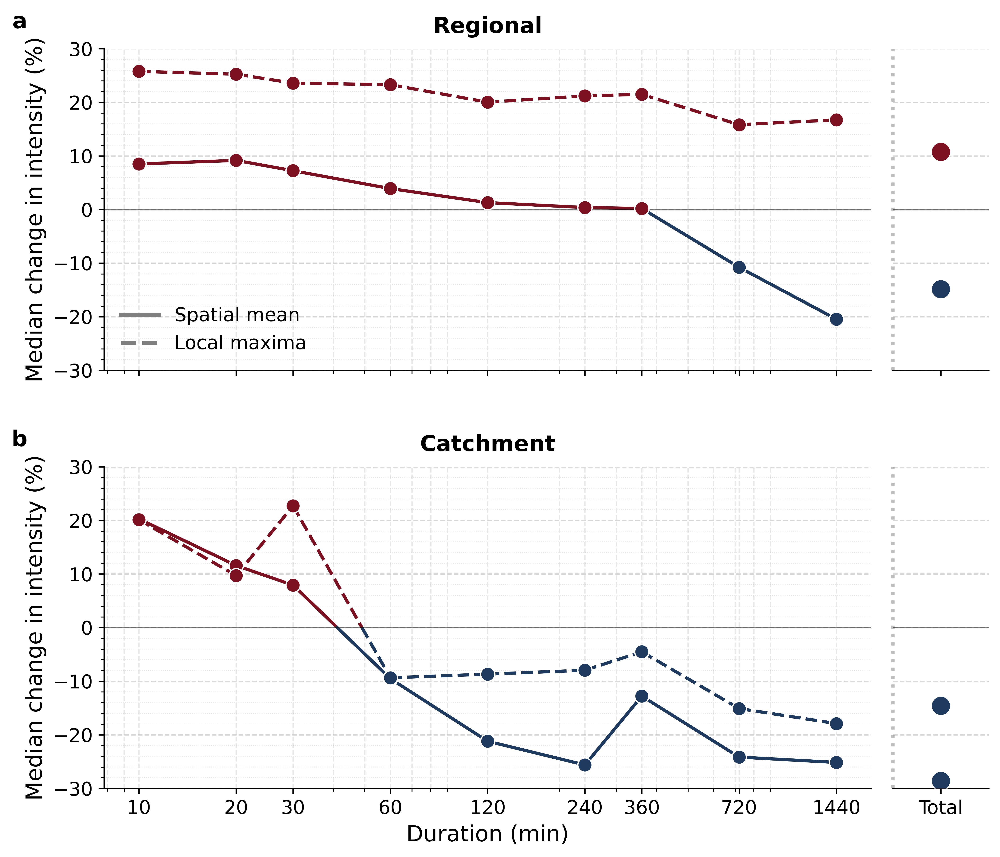

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import AutoMinorLocator
from matplotlib.lines import Line2D
import re
from typing import Optional, List, Union
from pathlib import Path

# --- Constants for Coloring ---
NEG_COLOR = "#1E3A5F"  # Dark Blue
POS_COLOR = "#7B1121"  # Dark Red

# Defining font sizes explicitly for readability
TICK_FONTSIZE = 12
LABEL_FONTSIZE = 14
TITLE_FONTSIZE = 14

def parse_duration_label(label: str) -> Optional[float]:
    """Parses duration label string into numeric minutes."""
    label_str = str(label).lower()
    if "total" in label_str: return None
    match = re.search(r"(\d+)", label_str)
    if not match: return None
    val = int(match.group(1))
    if "hr" in label_str or "hour" in label_str: return val * 60
    return val

def get_linestyle(label: str) -> str:
    """Determines linestyle based on label text."""
    l = label.lower()
    if "3" in l or "pixel" in l or "max" in l: 
        return '--' # Dashed for Local Maxima
    return '-'  # Solid for Spatial Mean

def plot_split_line(ax, x, y, linestyle, linewidth=2):
    """Plots a line split by color at y=0 with filled circle markers."""
    x = np.array(x)
    y = np.array(y)
    
    # 1. Draw the lines (split by color)
    for i in range(len(x) - 1):
        x1, x2 = x[i], x[i+1]
        y1, y2 = y[i], y[i+1]
        c1 = POS_COLOR if y1 >= 0 else NEG_COLOR
        c2 = POS_COLOR if y2 >= 0 else NEG_COLOR
        
        if (y1 >= 0 and y2 >= 0) or (y1 < 0 and y2 < 0):
            ax.plot([x1, x2], [y1, y2], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=2)
        else:
            ratio = abs(y1) / (abs(y1) + abs(y2))
            log_x1, log_x2 = np.log10(x1), np.log10(x2)
            log_x_zero = log_x1 + ratio * (log_x2 - log_x1)
            x_zero = 10**log_x_zero
            
            ax.plot([x1, x_zero], [y1, 0], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=2)
            ax.plot([x_zero, x2], [0, y2], color=c2, linestyle=linestyle, linewidth=linewidth, zorder=2)

    # 2. Draw the markers
    MARKER_SIZE = 9
    marker = 'o'
    for xi, yi in zip(x, y):
        c = POS_COLOR if yi >= 0 else NEG_COLOR
        ax.plot(xi, yi, marker=marker, color=c, markerfacecolor=c, 
                markeredgecolor='white', markeredgewidth=0.8, 
                markersize=MARKER_SIZE, zorder=3)

def plot_trend_split_subplots(
    summary: pd.DataFrame,
    select_blocks: List[Union[int, str]],
    ylabel: str = "Median change in intensity (%)",
    filename: Optional[str] = None,
    show: bool = True,
    save_dir: Path = Path("."),
    file_format: str = "pdf",
    dpi: int = 600,
) -> None:
    
    # Filter and categorize blocks
    # Note: Assuming _resolve_selection_labels is available in scope
    ordered_labels = _resolve_selection_labels(summary, select_blocks) 
    if not ordered_labels:
        print("No blocks selected.")
        return

    regional_labels = [l for l in ordered_labels if "basin" not in l.lower()]
    catchment_labels = [l for l in ordered_labels if "basin" in l.lower()]
    
    groups = [
        ("Regional", regional_labels),
        ("Catchment", catchment_labels)
    ]

    # --- Setup Figure Layout ---
    fig, axes = plt.subplots(
        2, 2, 
        figsize=(10, 8), 
        dpi=dpi, 
        sharex='col', 
        sharey=True,  
        gridspec_kw={'width_ratios': [8, 1], 'wspace': 0.05, 'hspace': 0.3} # Increased hspace slightly for titles
    )
    
    all_x_numerics = set()

    for row_idx, (group_name, labels) in enumerate(groups):
        ax_main = axes[row_idx, 0]
        ax_total = axes[row_idx, 1]
        
        # --- Data Plotting Loop ---
        for i, raw_label in enumerate(labels):
            sub = summary[summary["block_label"] == raw_label]
            # Note: Assuming _make_panel_data is available in scope
            x_labels, y_vals, _, _ = _make_panel_data(sub) 
            if len(y_vals) == 0: continue
            
            durations_x, durations_y = [], []
            total_y = None
            
            for lbl, val in zip(x_labels, y_vals):
                numeric_mins = parse_duration_label(lbl)
                if numeric_mins is not None:
                    durations_x.append(numeric_mins)
                    durations_y.append(val)
                    all_x_numerics.add(numeric_mins)
                elif "total" in str(lbl).lower():
                    total_y = val
            
            linestyle = get_linestyle(raw_label)
            
            if durations_x:
                plot_split_line(ax_main, durations_x, durations_y, linestyle)
            
            if total_y is not None:
                c_total = POS_COLOR if total_y >= 0 else NEG_COLOR
                # x_pos is exactly 0
                ax_total.scatter(
                    [0], [total_y], 
                    color=c_total, marker='o', s=150, zorder=5, 
                    edgecolor='white', linewidth=0.8
                )

        # --- Subplot Formatting ---
        
        # 1. Title Centered
        ax_main.set_title(group_name, loc='center', fontsize=TITLE_FONTSIZE, fontweight='bold', pad=10)
        
        # 2. Panel Label (a / b) on the left
        panel_label = "a" if row_idx == 0 else "b"
        # Position: x=-0.1 (outside left), y=1.0 (top aligned with axis)
        ax_main.text(-0.1, 1.05, panel_label, transform=ax_main.transAxes, 
                     fontsize=TITLE_FONTSIZE, fontweight='bold', va='bottom', ha='right')

        # 3. Y-Axis Limits (-30 to 30)
        ax_main.set_ylim(-30, 30)

        # Axes Configurations
        ax_main.set_xscale('log')
        ax_main.grid(True, which='both', axis='x', linestyle='--', linewidth=0.8, alpha=0.3)
        ax_main.yaxis.set_minor_locator(AutoMinorLocator(5))
        ax_main.grid(True, which='major', axis='y', linestyle='--', linewidth=0.8, alpha=0.5)
        ax_main.grid(True, which='minor', axis='y', linestyle=':', linewidth=0.5, alpha=0.3)
        
        ax_total.set_xlim(-0.5, 0.5)
        ax_total.set_xticks([0])
        ax_total.set_xticklabels(["Total"], fontsize=TICK_FONTSIZE, fontweight='normal')
        ax_total.tick_params(axis='y', left=False, which='both')
        ax_total.grid(True, which='major', axis='y', linestyle='--', linewidth=0.8, alpha=0.5)
        ax_total.axvline(-0.5, color='gray', linestyle=':', linewidth=2, clip_on=False, alpha=0.5)
        
        ax_main.spines['right'].set_visible(False)
        ax_main.spines['top'].set_visible(False)
        ax_total.spines['left'].set_visible(False)
        ax_total.spines['top'].set_visible(False)
        ax_total.spines['right'].set_visible(False)
        ax_main.axhline(0, color='black', linewidth=1, alpha=0.5)
        ax_total.axhline(0, color='black', linewidth=1, alpha=0.5)
        
        ax_main.set_ylabel(ylabel, fontsize=LABEL_FONTSIZE)
        ax_main.tick_params(axis='y', labelsize=TICK_FONTSIZE)

    # --- Common Axis Formatting ---
    sorted_ticks = sorted(list(all_x_numerics))
    for ax in axes[:, 0]:
        ax.set_xticks(sorted_ticks)
        ax.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
        ax.set_xticklabels(sorted_ticks, fontsize=TICK_FONTSIZE)
    
    axes[1, 0].set_xlabel("Duration (min)", fontsize=LABEL_FONTSIZE)

    # --- Legend Polish ---
    h_mean = Line2D([0], [0], color='gray', linestyle='-', linewidth=2.5, label='Spatial mean')
    h_max = Line2D([0], [0], color='gray', linestyle='--', linewidth=2.5, label='Local maxima')

    axes[0, 0].legend(
        handles=[h_mean, h_max], 
        loc='best', 
        frameon=False, 
        fontsize=TICK_FONTSIZE
    )
    
    plt.subplots_adjust(top=0.92, right=0.9)
    
    _save_or_show_figure(
        fig=fig,
        filename=filename,
        dpi=dpi,
        save_dir=save_dir,
        file_format=file_format,
        show=show,
    )

# =========================================================
# Usage Example
# =========================================================

selected_blocks = [
    "full domain",
    "Block size 3",
    "raanana basin",
    "Raanana Basin 3 pixel",
]

# Ensure summary_pooled is defined before running
plot_trend_split_subplots(
   summary_pooled,
   select_blocks=selected_blocks,
   filename="Fig_3_Split_Final",
   show=True
)

In [11]:
summary_pooled.columns

Index(['block_label', 'block_size_num', 'measure', 'duration_min',
       'duration_label', 'median_hist', 'median_pgw', 'pct_change', 'q1', 'q3',
       'duration_order', 'ci_low', 'ci_high', 'mode', 'iqr_source'],
      dtype='object')

Starting Plot Generation...
Plotting 'full domain' (Group: Regional): Found 10 rows.
Plotting 'Block size 3' (Group: Regional): Found 10 rows.
Plotting 'raanana basin' (Group: Catchment): Found 10 rows.
Plotting 'Raanana Basin 3 pixel' (Group: Catchment): Found 10 rows.
Saved to Fig_3_Split_Final_Robust_v2.pdf


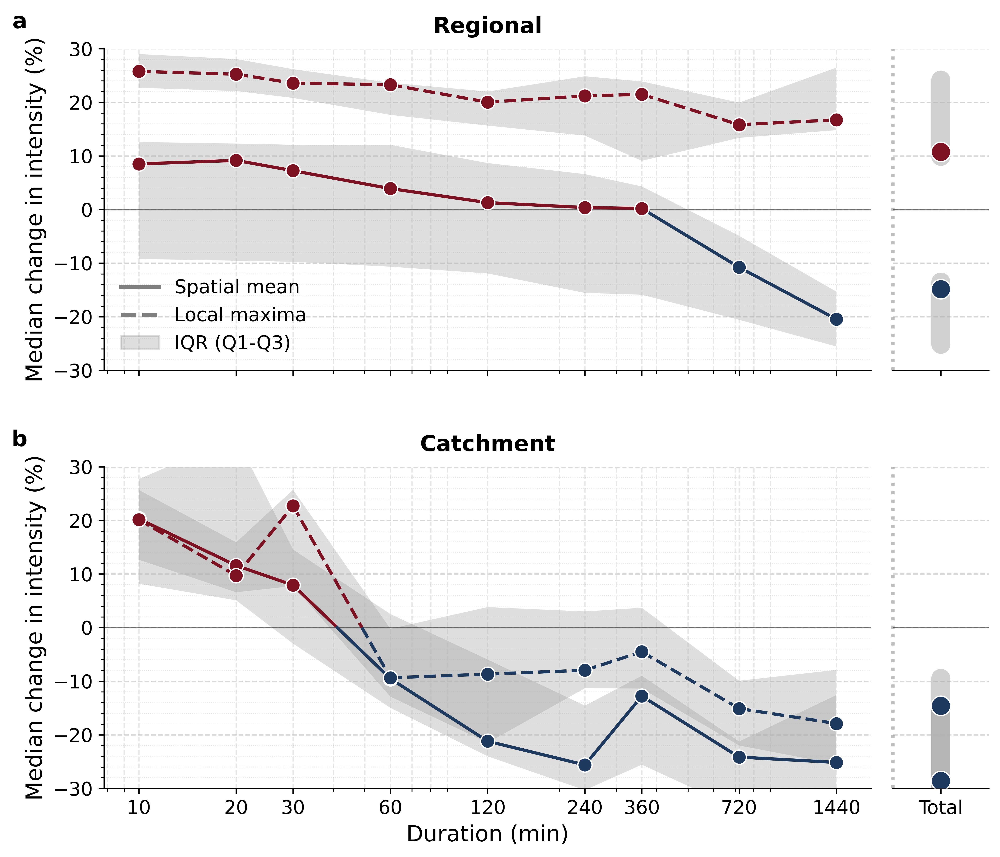

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import AutoMinorLocator
from matplotlib.lines import Line2D
import re
from typing import Optional, List, Union
from pathlib import Path

# --- Constants for Coloring ---
NEG_COLOR = "#1E3A5F"  # Dark Blue
POS_COLOR = "#7B1121"  # Dark Red
IQR_COLOR = "gray"     # Color for shading
IQR_ALPHA = 0.25       # Transparency

# Defining font sizes explicitly for readability
TICK_FONTSIZE = 12
LABEL_FONTSIZE = 14
TITLE_FONTSIZE = 14

def parse_duration_label(label: str) -> Optional[float]:
    """Parses duration label string into numeric minutes."""
    label_str = str(label).lower()
    if "total" in label_str: return None
    match = re.search(r"(\d+)", label_str)
    if not match: return None
    val = int(match.group(1))
    if "hr" in label_str or "hour" in label_str: return val * 60
    return val

def get_linestyle(label: str) -> str:
    """Determines linestyle based on label text."""
    l = label.lower()
    if "3" in l or "pixel" in l or "max" in l: 
        return '--' # Dashed for Local Maxima
    return '-'  # Solid for Spatial Mean

def plot_split_line(ax, x, y, linestyle, linewidth=2):
    """Plots a line split by color at y=0 with filled circle markers."""
    x = np.array(x)
    y = np.array(y)
    
    # 1. Draw the lines (split by color)
    for i in range(len(x) - 1):
        x1, x2 = x[i], x[i+1]
        y1, y2 = y[i], y[i+1]
        c1 = POS_COLOR if y1 >= 0 else NEG_COLOR
        c2 = POS_COLOR if y2 >= 0 else NEG_COLOR
        
        # Skip segment if NaNs are present
        if np.isnan(y1) or np.isnan(y2):
            continue

        if (y1 >= 0 and y2 >= 0) or (y1 < 0 and y2 < 0):
            ax.plot([x1, x2], [y1, y2], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=3)
        else:
            ratio = abs(y1) / (abs(y1) + abs(y2))
            log_x1, log_x2 = np.log10(x1), np.log10(x2)
            log_x_zero = log_x1 + ratio * (log_x2 - log_x1)
            x_zero = 10**log_x_zero
            
            ax.plot([x1, x_zero], [y1, 0], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=3)
            ax.plot([x_zero, x2], [0, y2], color=c2, linestyle=linestyle, linewidth=linewidth, zorder=3)

    # 2. Draw the markers
    MARKER_SIZE = 9
    marker = 'o'
    for xi, yi in zip(x, y):
        if np.isnan(yi): continue
        c = POS_COLOR if yi >= 0 else NEG_COLOR
        ax.plot(xi, yi, marker=marker, color=c, markerfacecolor=c, 
                markeredgecolor='white', markeredgewidth=0.8, 
                markersize=MARKER_SIZE, zorder=4)

# --- Helper Functions ---
def _resolve_selection_labels(summary, select_blocks):
    """Simple pass-through if lists match, ensures strings."""
    return [str(b) for b in select_blocks]

def _save_or_show_figure(fig, filename, show, save_dir, file_format, dpi):
    """Basic implementation to ensure plot shows."""
    if filename:
        path = Path(save_dir) / f"{filename}.{file_format}"
        fig.savefig(path, dpi=dpi, bbox_inches='tight')
        print(f"Saved to {path}")
    if show:
        plt.show()

def plot_trend_split_subplots(
    summary: pd.DataFrame,
    select_blocks: List[Union[int, str]],
    ylabel: str = "Median change in intensity (%)",
    filename: Optional[str] = None,
    show: bool = True,
    save_dir: Path = Path("."),
    file_format: str = "pdf",
    dpi: int = 600,
) -> None:
    
    # --- Robust Filtering (Fixing Case Sensitivity) ---
    # Create a copy to avoid SettingWithCopy warnings and add a lowercase column for matching
    df_clean = summary.copy()
    df_clean['block_label_lower'] = df_clean['block_label'].astype(str).str.lower().str.strip()
    
    ordered_labels = _resolve_selection_labels(df_clean, select_blocks) 
    if not ordered_labels:
        print("No blocks selected.")
        return

    regional_labels = [l for l in ordered_labels if "basin" not in l.lower()]
    catchment_labels = [l for l in ordered_labels if "basin" in l.lower()]
    
    groups = [
        ("Regional", regional_labels),
        ("Catchment", catchment_labels)
    ]

    # --- Setup Figure Layout ---
    fig, axes = plt.subplots(
        2, 2, 
        figsize=(10, 8), 
        dpi=dpi, 
        sharex='col', 
        sharey=True,  
        gridspec_kw={'width_ratios': [8, 1], 'wspace': 0.05, 'hspace': 0.3}
    )
    
    all_x_numerics = set()

    for row_idx, (group_name, labels) in enumerate(groups):
        ax_main = axes[row_idx, 0]
        ax_total = axes[row_idx, 1]
        
        # --- Data Plotting Loop ---
        for i, raw_label in enumerate(labels):
            # Use lowercase matching logic
            search_label = str(raw_label).lower().strip()
            sub = df_clean[df_clean["block_label_lower"] == search_label]
            
            # --- DEBUG PRINT ---
            print(f"Plotting '{raw_label}' (Group: {group_name}): Found {len(sub)} rows.")
            
            if sub.empty: 
                print(f"WARNING: No data found for '{raw_label}'. Check spelling/capitalization.")
                continue

            # --- Data Extraction ---
            duration_data = {} 
            total_stats = None

            for _, row in sub.iterrows():
                lbl = row['duration_label']
                numeric_mins = parse_duration_label(lbl)
                
                try: val = float(row['pct_change'])
                except: val = np.nan
                
                try: q1 = float(row['q1'])
                except: q1 = np.nan
                
                try: q3 = float(row['q3'])
                except: q3 = np.nan

                if numeric_mins is not None:
                    duration_data[numeric_mins] = {'y': val, 'q1': q1, 'q3': q3}
                    all_x_numerics.add(numeric_mins)
                elif "total" in str(lbl).lower():
                    total_stats = {'y': val, 'q1': q1, 'q3': q3}

            if not duration_data:
                continue

            # Sort and prepare arrays
            sorted_mins = sorted(duration_data.keys())
            x_arr = np.array(sorted_mins)
            y_arr = np.array([duration_data[m]['y'] for m in sorted_mins])
            q1_arr = np.array([duration_data[m]['q1'] for m in sorted_mins])
            q3_arr = np.array([duration_data[m]['q3'] for m in sorted_mins])
            
            linestyle = get_linestyle(raw_label)
            
            # --- 1. Plot Shading (Background) ---
            # Use mask to only fill where Q1 and Q3 are valid
            mask_iqr = ~np.isnan(q1_arr) & ~np.isnan(q3_arr)
            if np.any(mask_iqr):
                ax_main.fill_between(
                    x_arr[mask_iqr], q1_arr[mask_iqr], q3_arr[mask_iqr], 
                    color=IQR_COLOR, alpha=IQR_ALPHA, zorder=1, edgecolor=None
                )

            # --- 2. Plot Line & Markers (Foreground) ---
            # Use mask to only plot where Y is valid (independent of IQR)
            mask_y = ~np.isnan(y_arr)
            if np.any(mask_y):
                plot_split_line(ax_main, x_arr[mask_y], y_arr[mask_y], linestyle)
            
            # --- 3. Plot Total Point ---
            if total_stats is not None:
                y_tot = total_stats['y']
                q1_tot = total_stats['q1']
                q3_tot = total_stats['q3']
                
                if not np.isnan(y_tot):
                    c_total = POS_COLOR if y_tot >= 0 else NEG_COLOR
                    
                    if not np.isnan(q1_tot) and not np.isnan(q3_tot):
                        ax_total.vlines(
                            0, q1_tot, q3_tot, 
                            color=IQR_COLOR, alpha=IQR_ALPHA+0.1, linewidth=12, zorder=1, capstyle='round'
                        )

                    ax_total.scatter(
                        [0], [y_tot], 
                        color=c_total, marker='o', s=150, zorder=5, 
                        edgecolor='white', linewidth=0.8
                    )

        # --- Subplot Formatting ---
        ax_main.set_title(group_name, loc='center', fontsize=TITLE_FONTSIZE, fontweight='bold', pad=10)
        
        panel_label = "a" if row_idx == 0 else "b"
        ax_main.text(-0.1, 1.05, panel_label, transform=ax_main.transAxes, 
                     fontsize=TITLE_FONTSIZE, fontweight='bold', va='bottom', ha='right')

        ax_main.set_ylim(-30, 30)
        ax_main.set_xscale('log')
        ax_main.grid(True, which='both', axis='x', linestyle='--', linewidth=0.8, alpha=0.3)
        ax_main.yaxis.set_minor_locator(AutoMinorLocator(5))
        ax_main.grid(True, which='major', axis='y', linestyle='--', linewidth=0.8, alpha=0.5)
        ax_main.grid(True, which='minor', axis='y', linestyle=':', linewidth=0.5, alpha=0.3)
        
        ax_total.set_xlim(-0.5, 0.5)
        ax_total.set_xticks([0])
        ax_total.set_xticklabels(["Total"], fontsize=TICK_FONTSIZE, fontweight='normal')
        ax_total.tick_params(axis='y', left=False, which='both')
        ax_total.grid(True, which='major', axis='y', linestyle='--', linewidth=0.8, alpha=0.5)
        ax_total.axvline(-0.5, color='gray', linestyle=':', linewidth=2, clip_on=False, alpha=0.5)
        
        ax_main.spines['right'].set_visible(False)
        ax_main.spines['top'].set_visible(False)
        ax_total.spines['left'].set_visible(False)
        ax_total.spines['top'].set_visible(False)
        ax_total.spines['right'].set_visible(False)
        ax_main.axhline(0, color='black', linewidth=1, alpha=0.5)
        ax_total.axhline(0, color='black', linewidth=1, alpha=0.5)
        
        ax_main.set_ylabel(ylabel, fontsize=LABEL_FONTSIZE)
        ax_main.tick_params(axis='y', labelsize=TICK_FONTSIZE)

    # --- Common Axis Formatting ---
    if all_x_numerics:
        sorted_ticks = sorted(list(all_x_numerics))
        for ax in axes[:, 0]:
            ax.set_xticks(sorted_ticks)
            ax.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
            ax.set_xticklabels(sorted_ticks, fontsize=TICK_FONTSIZE)
    
    axes[1, 0].set_xlabel("Duration (min)", fontsize=LABEL_FONTSIZE)

    # --- Legend Polish ---
    h_mean = Line2D([0], [0], color='gray', linestyle='-', linewidth=2.5, label='Spatial mean')
    h_max = Line2D([0], [0], color='gray', linestyle='--', linewidth=2.5, label='Local maxima')
    h_iqr = plt.Rectangle((0,0),1,1, color=IQR_COLOR, alpha=IQR_ALPHA, label='IQR (Q1-Q3)')

    axes[0, 0].legend(
        handles=[h_mean, h_max, h_iqr], 
        loc='best', 
        frameon=False, 
        fontsize=TICK_FONTSIZE
    )
    
    plt.subplots_adjust(top=0.92, right=0.9)
    
    _save_or_show_figure(
        fig=fig,
        filename=filename,
        dpi=dpi,
        save_dir=save_dir,
        file_format=file_format,
        show=show,
    )

# =========================================================
# Usage Example
# =========================================================

selected_blocks = [
    "full domain",
    "Block size 3",
    "raanana basin",
    "Raanana Basin 3 pixel",
]

# Ensure summary_pooled is defined before running
if 'summary_pooled' in locals():
    print("Starting Plot Generation...")
    plot_trend_split_subplots(
       summary_pooled,
       select_blocks=selected_blocks,
       filename="Fig_3_Split_Final_Robust_v2",
       show=True
    )
else:
    print("Error: 'summary_pooled' DataFrame is missing.")

Saved to Fig_Borders.pdf


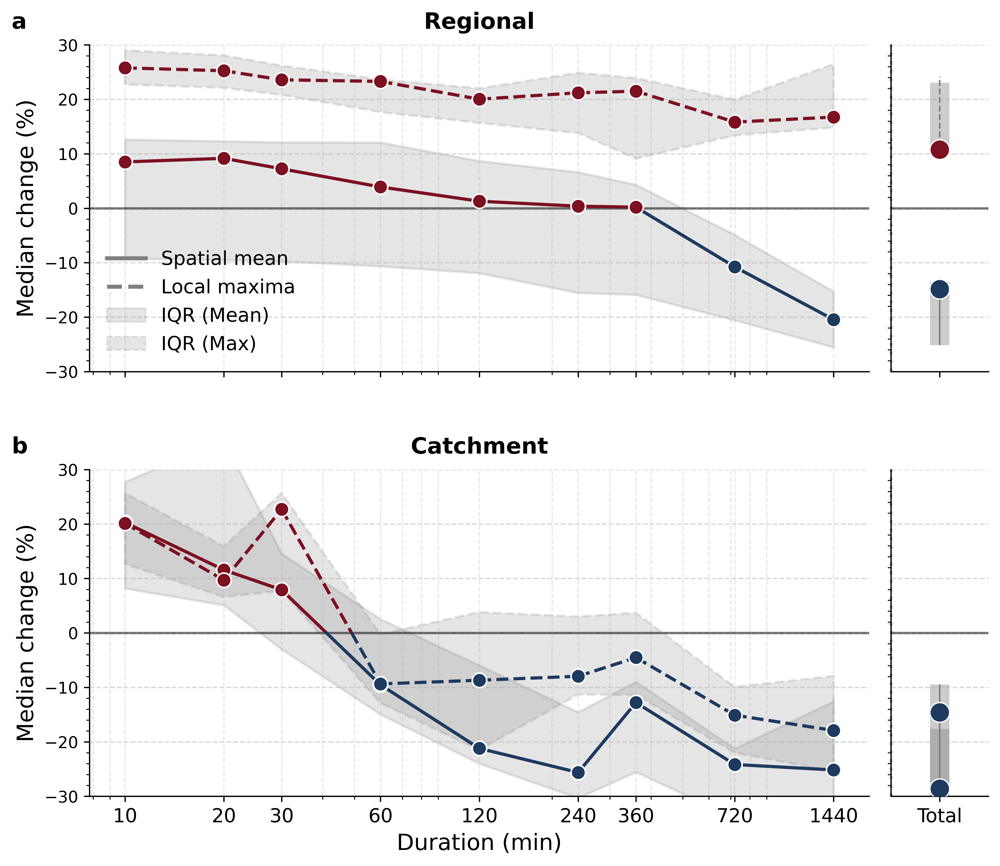

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import AutoMinorLocator
from matplotlib.lines import Line2D
import re
from typing import Optional, List, Union
from pathlib import Path

# --- Constants ---
NEG_COLOR = "#1E3A5F"
POS_COLOR = "#7B1121"
IQR_COLOR = "gray"
IQR_ALPHA = 0.2  # הורדתי טיפה את השקיפות כדי שהגבול יבלוט יותר

TICK_FONTSIZE = 12
LABEL_FONTSIZE = 14
TITLE_FONTSIZE = 14

# --- Helper Functions (Same as before) ---
def parse_duration_label(label: str) -> Optional[float]:
    label_str = str(label).lower()
    if "total" in label_str: return None
    match = re.search(r"(\d+)", label_str)
    if not match: return None
    val = int(match.group(1))
    if "hr" in label_str or "hour" in label_str: return val * 60
    return val

def get_linestyle(label: str) -> str:
    l = label.lower()
    if "3" in l or "pixel" in l or "max" in l: 
        return '--' 
    return '-' 

def _resolve_selection_labels(summary, select_blocks):
    return [str(b) for b in select_blocks]

def _save_or_show_figure(fig, filename, show, save_dir, file_format, dpi):
    if filename:
        path = Path(save_dir) / f"{filename}.{file_format}"
        fig.savefig(path, dpi=dpi, bbox_inches='tight')
        print(f"Saved to {path}")
    if show:
        plt.show()

def plot_split_line(ax, x, y, linestyle, linewidth=2):
    x = np.array(x)
    y = np.array(y)
    for i in range(len(x) - 1):
        x1, x2 = x[i], x[i+1]
        y1, y2 = y[i], y[i+1]
        if np.isnan(y1) or np.isnan(y2): continue
        c1, c2 = (POS_COLOR if y1 >= 0 else NEG_COLOR), (POS_COLOR if y2 >= 0 else NEG_COLOR)
        
        if (y1 >= 0 and y2 >= 0) or (y1 < 0 and y2 < 0):
            ax.plot([x1, x2], [y1, y2], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=3)
        else:
            ratio = abs(y1) / (abs(y1) + abs(y2))
            log_x_zero = np.log10(x1) + ratio * (np.log10(x2) - np.log10(x1))
            x_zero = 10**log_x_zero
            ax.plot([x1, x_zero], [y1, 0], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=3)
            ax.plot([x_zero, x2], [0, y2], color=c2, linestyle=linestyle, linewidth=linewidth, zorder=3)

    for xi, yi in zip(x, y):
        if np.isnan(yi): continue
        c = POS_COLOR if yi >= 0 else NEG_COLOR
        ax.plot(xi, yi, marker='o', color=c, markerfacecolor=c, markeredgecolor='white', markersize=9, zorder=4)

# --- Main Plot Code With Borders ---
def plot_trend_borders(summary: pd.DataFrame, select_blocks: List[str], filename="Fig_Borders", show=True):
    df_clean = summary.copy()
    df_clean['block_label_lower'] = df_clean['block_label'].astype(str).str.lower().str.strip()
    ordered_labels = _resolve_selection_labels(df_clean, select_blocks)
    
    regional_labels = [l for l in ordered_labels if "basin" not in l.lower()]
    catchment_labels = [l for l in ordered_labels if "basin" in l.lower()]
    groups = [("Regional", regional_labels), ("Catchment", catchment_labels)]

    fig, axes = plt.subplots(2, 2, figsize=(10, 8), dpi=600, sharex='col', sharey=True, 
                             gridspec_kw={'width_ratios': [8, 1], 'wspace': 0.05, 'hspace': 0.3})

    all_x_numerics = set()

    for row_idx, (group_name, labels) in enumerate(groups):
        ax_main, ax_total = axes[row_idx, 0], axes[row_idx, 1]
        
        for raw_label in labels:
            search_label = str(raw_label).lower().strip()
            sub = df_clean[df_clean["block_label_lower"] == search_label]
            if sub.empty: continue

            duration_data = {}
            total_stats = None

            for _, row in sub.iterrows():
                lbl = row['duration_label']
                numeric_mins = parse_duration_label(lbl)
                try: val, q1, q3 = float(row['pct_change']), float(row['q1']), float(row['q3'])
                except: val, q1, q3 = np.nan, np.nan, np.nan

                if numeric_mins:
                    duration_data[numeric_mins] = {'y': val, 'q1': q1, 'q3': q3}
                    all_x_numerics.add(numeric_mins)
                elif "total" in str(lbl).lower():
                    total_stats = {'y': val, 'q1': q1, 'q3': q3}

            if not duration_data: continue
            
            # Prepare Arrays
            sorted_mins = sorted(duration_data.keys())
            x_arr = np.array(sorted_mins)
            y_arr = np.array([duration_data[m]['y'] for m in sorted_mins])
            q1_arr = np.array([duration_data[m]['q1'] for m in sorted_mins])
            q3_arr = np.array([duration_data[m]['q3'] for m in sorted_mins])
            
            linestyle = get_linestyle(raw_label) # '-' or '--'

            # --- KEY CHANGE: Add Borders to Shade ---
            mask_iqr = ~np.isnan(q1_arr) & ~np.isnan(q3_arr)
            if np.any(mask_iqr):
                ax_main.fill_between(
                    x_arr[mask_iqr], q1_arr[mask_iqr], q3_arr[mask_iqr], 
                    color=IQR_COLOR, alpha=IQR_ALPHA, zorder=1,
                    # Add Border Logic:
                    edgecolor=IQR_COLOR,  # Color of the border
                    linestyle=linestyle,  # Match the line style!
                    linewidth=1.5         # Visible width
                )

            mask_y = ~np.isnan(y_arr)
            if np.any(mask_y):
                plot_split_line(ax_main, x_arr[mask_y], y_arr[mask_y], linestyle)
            
            if total_stats and not np.isnan(total_stats['y']):
                y_tot, q1_tot, q3_tot = total_stats['y'], total_stats['q1'], total_stats['q3']
                c_total = POS_COLOR if y_tot >= 0 else NEG_COLOR
                
                if not np.isnan(q1_tot) and not np.isnan(q3_tot):
                    # Applying linestyle to the total bar as well via 'linestyle' param in vlines
                    ax_total.vlines(0, q1_tot, q3_tot, color=IQR_COLOR, alpha=IQR_ALPHA+0.2, 
                                    linewidth=12, zorder=1, capstyle='butt', linestyles=linestyle)
                    # Adding a thin border to the total bar for extra clarity
                    ax_total.vlines(0, q1_tot, q3_tot, color=IQR_COLOR, alpha=1, 
                                    linewidth=1, zorder=2, linestyles=linestyle)

                ax_total.scatter([0], [y_tot], color=c_total, marker='o', s=150, zorder=5, edgecolor='white', linewidth=0.8)

        # Formatting (Standard)
        ax_main.set_title(group_name, loc='center', fontsize=TITLE_FONTSIZE, fontweight='bold', pad=10)
        ax_main.text(-0.1, 1.05, "a" if row_idx == 0 else "b", transform=ax_main.transAxes, fontsize=TITLE_FONTSIZE, fontweight='bold')
        ax_main.set_ylim(-30, 30)
        ax_main.set_xscale('log')
        ax_main.grid(True, which='both', axis='x', linestyle='--', alpha=0.3)
        ax_main.yaxis.set_minor_locator(AutoMinorLocator(5))
        ax_main.grid(True, which='major', axis='y', linestyle='--', alpha=0.5)
        
        ax_total.set_xlim(-0.5, 0.5); ax_total.set_xticks([0]); ax_total.set_xticklabels(["Total"], fontsize=TICK_FONTSIZE)
        ax_total.tick_params(left=False); ax_total.grid(axis='y', linestyle='--', alpha=0.5)
        ax_total.axvline(-0.5, color='gray', linestyle=':', linewidth=2, clip_on=False, alpha=0.5)
        
        for ax in [ax_main, ax_total]: 
            ax.spines['right'].set_visible(False); ax.spines['top'].set_visible(False)
            ax.axhline(0, color='black', alpha=0.5)
        ax_main.set_ylabel("Median change (%)", fontsize=LABEL_FONTSIZE)

    if all_x_numerics:
        ticks = sorted(list(all_x_numerics))
        for ax in axes[:, 0]: 
            ax.set_xticks(ticks); ax.get_xaxis().set_major_formatter(ticker.ScalarFormatter()); ax.set_xticklabels(ticks, fontsize=TICK_FONTSIZE)
    axes[1, 0].set_xlabel("Duration (min)", fontsize=LABEL_FONTSIZE)

    # Legend
    h_mean = Line2D([0], [0], color='gray', linestyle='-', linewidth=2.5, label='Spatial mean')
    h_max = Line2D([0], [0], color='gray', linestyle='--', linewidth=2.5, label='Local maxima')
    # Custom Legend for Shades
    h_shade_solid = plt.Rectangle((0,0),1,1, facecolor=IQR_COLOR, alpha=IQR_ALPHA, edgecolor=IQR_COLOR, linestyle='-', label='IQR (Mean)')
    h_shade_dash = plt.Rectangle((0,0),1,1, facecolor=IQR_COLOR, alpha=IQR_ALPHA, edgecolor=IQR_COLOR, linestyle='--', label='IQR (Max)')

    axes[0, 0].legend(handles=[h_mean, h_max, h_shade_solid, h_shade_dash], loc='best', frameon=False, fontsize=TICK_FONTSIZE)
    plt.subplots_adjust(top=0.92, right=0.9)
    _save_or_show_figure(fig, filename, show, Path("."), "pdf", 600)

# Run it
if 'summary_pooled' in locals():
    selected_blocks = ["full domain", "Block size 3", "raanana basin", "Raanana Basin 3 pixel"]
    plot_trend_borders(summary_pooled, selected_blocks)

Saved to Fig_Final_Hatching.pdf


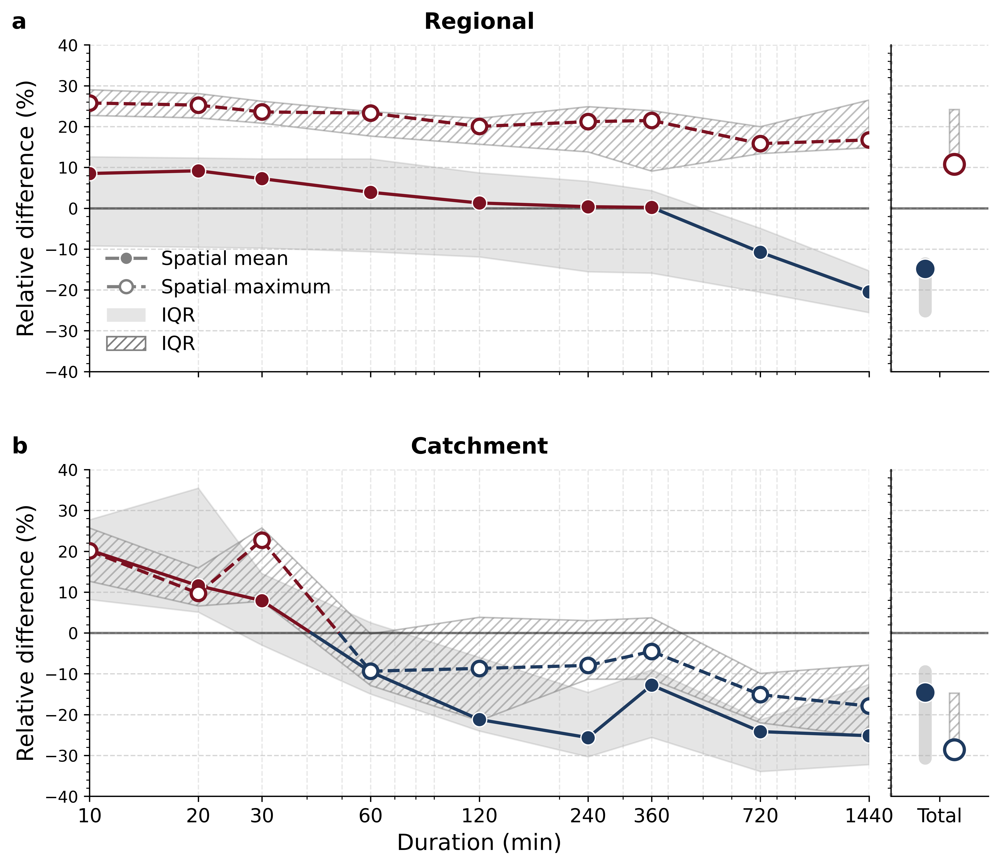

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import AutoMinorLocator
from matplotlib.lines import Line2D
import re
from typing import Optional, List, Union
from pathlib import Path

# --- Constants ---
NEG_COLOR = "#1E3A5F"  # Dark Blue
POS_COLOR = "#7B1121"  # Dark Red
IQR_COLOR = "gray"
IQR_ALPHA = 0.2

TICK_FONTSIZE = 12
LABEL_FONTSIZE = 14
TITLE_FONTSIZE = 14

# --- Helper Functions ---
def parse_duration_label(label: str) -> Optional[float]:
    """Parses duration label string into numeric minutes."""
    label_str = str(label).lower()
    if "total" in label_str: return None
    match = re.search(r"(\d+)", label_str)
    if not match: return None
    val = int(match.group(1))
    if "hr" in label_str or "hour" in label_str: return val * 60
    return val

def get_linestyle(label: str) -> str:
    """Determines linestyle based on label text."""
    l = label.lower()
    if "3" in l or "pixel" in l or "max" in l: 
        return '--' 
    return '-' 

def _resolve_selection_labels(summary, select_blocks):
    """Simple pass-through if lists match, ensures strings."""
    return [str(b) for b in select_blocks]

def _save_or_show_figure(fig, filename, show, save_dir, file_format, dpi):
    """Basic implementation to ensure plot shows."""
    if filename:
        path = Path(save_dir) / f"{filename}.{file_format}"
        fig.savefig(path, dpi=dpi, bbox_inches='tight')
        print(f"Saved to {path}")
    if show:
        plt.show()

def plot_split_line(ax, x, y, linestyle, is_hollow=False, linewidth=2):
    """
    Plots a line split by color at y=0.
    Handles marker style (Filled vs Hollow) based on is_hollow flag.
    """
    x = np.array(x)
    y = np.array(y)
    
    # 1. Draw the lines (split by color)
    for i in range(len(x) - 1):
        x1, x2 = x[i], x[i+1]
        y1, y2 = y[i], y[i+1]
        
        if np.isnan(y1) or np.isnan(y2): continue
        
        c1 = POS_COLOR if y1 >= 0 else NEG_COLOR
        c2 = POS_COLOR if y2 >= 0 else NEG_COLOR
        
        if (y1 >= 0 and y2 >= 0) or (y1 < 0 and y2 < 0):
            ax.plot([x1, x2], [y1, y2], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=3)
        else:
            ratio = abs(y1) / (abs(y1) + abs(y2))
            log_x_zero = np.log10(x1) + ratio * (np.log10(x2) - np.log10(x1))
            x_zero = 10**log_x_zero
            
            ax.plot([x1, x_zero], [y1, 0], color=c1, linestyle=linestyle, linewidth=linewidth, zorder=3)
            ax.plot([x_zero, x2], [0, y2], color=c2, linestyle=linestyle, linewidth=linewidth, zorder=3)

    # 2. Draw the markers
    MARKER_SIZE = 9
    for xi, yi in zip(x, y):
        if np.isnan(yi): continue
        c = POS_COLOR if yi >= 0 else NEG_COLOR
        
        if is_hollow:
            # Hollow circle: White face, colored edge
            ax.plot(xi, yi, marker='o', color=c, markerfacecolor='white', 
                    markeredgecolor=c, markeredgewidth=2, markersize=MARKER_SIZE, zorder=4)
        else:
            # Filled circle: Colored face, white edge
            ax.plot(xi, yi, marker='o', color=c, markerfacecolor=c, 
                    markeredgecolor='white', markeredgewidth=0.8, markersize=MARKER_SIZE, zorder=4)

# --- Main Plot Code ---
def plot_trend_final_hatching(summary: pd.DataFrame, select_blocks: List[str], filename="Fig_Final_Hatching", show=True):
    # Prepare Data
    df_clean = summary.copy()
    df_clean['block_label_lower'] = df_clean['block_label'].astype(str).str.lower().str.strip()
    ordered_labels = _resolve_selection_labels(df_clean, select_blocks)
    
    groups = [("Regional", [l for l in ordered_labels if "basin" not in l.lower()]),
              ("Catchment", [l for l in ordered_labels if "basin" in l.lower()])]

    fig, axes = plt.subplots(2, 2, figsize=(10, 8), dpi=600, sharex='col', sharey=True, 
                             gridspec_kw={'width_ratios': [8, 1], 'wspace': 0.05, 'hspace': 0.3})

    all_x_numerics = set()

    for row_idx, (group_name, labels) in enumerate(groups):
        ax_main, ax_total = axes[row_idx, 0], axes[row_idx, 1]
        
        # Offsets for the Total plot to avoid overlap
        total_offsets = [-0.15, 0.15] 

        for i, raw_label in enumerate(labels):
            search_label = str(raw_label).lower().strip()
            sub = df_clean[df_clean["block_label_lower"] == search_label]
            
            if sub.empty: continue

            # Data Extraction
            duration_data = {}
            total_stats = None
            for _, row in sub.iterrows():
                lbl = row['duration_label']
                numeric_mins = parse_duration_label(lbl)
                try: val, q1, q3 = float(row['pct_change']), float(row['q1']), float(row['q3'])
                except: val, q1, q3 = np.nan, np.nan, np.nan
                
                if numeric_mins: 
                    duration_data[numeric_mins] = {'y': val, 'q1': q1, 'q3': q3}
                    all_x_numerics.add(numeric_mins)
                elif "total" in str(lbl).lower(): 
                    total_stats = {'y': val, 'q1': q1, 'q3': q3}

            if not duration_data: continue
            
            # Prepare Arrays
            sorted_mins = sorted(duration_data.keys())
            x_arr = np.array(sorted_mins)
            y_arr = np.array([duration_data[m]['y'] for m in sorted_mins])
            q1_arr = np.array([duration_data[m]['q1'] for m in sorted_mins])
            q3_arr = np.array([duration_data[m]['q3'] for m in sorted_mins])
            
            linestyle = get_linestyle(raw_label)
            is_local_max = (linestyle == '--') # Flag for hollow markers

            # 1. Hatching / Shading
            mask_iqr = ~np.isnan(q1_arr) & ~np.isnan(q3_arr)
            if np.any(mask_iqr):
                if is_local_max:
                    # Hatched for Local Maxima
                    ax_main.fill_between(x_arr[mask_iqr], q1_arr[mask_iqr], q3_arr[mask_iqr], 
                                         facecolor="none", edgecolor=IQR_COLOR, hatch='////', 
                                         alpha=0.5, zorder=1)
                else:
                    # Solid for Spatial Mean
                    ax_main.fill_between(x_arr[mask_iqr], q1_arr[mask_iqr], q3_arr[mask_iqr], 
                                         color=IQR_COLOR, alpha=IQR_ALPHA, zorder=1)

            # 2. Lines & Markers
            mask_y = ~np.isnan(y_arr)
            if np.any(mask_y):
                plot_split_line(ax_main, x_arr[mask_y], y_arr[mask_y], linestyle, is_hollow=is_local_max)
            
            # 3. Total Plot
            if total_stats and not np.isnan(total_stats['y']):
                y_tot, q1_tot, q3_tot = total_stats['y'], total_stats['q1'], total_stats['q3']
                c_total = POS_COLOR if y_tot >= 0 else NEG_COLOR
                x_off = total_offsets[i % 2]
                
                # IQR Bar
                if not np.isnan(q1_tot) and not np.isnan(q3_tot):
                    if is_local_max:
                        # Hatching box for Total
                        rect = plt.Rectangle((x_off-0.05, q1_tot), 0.1, q3_tot-q1_tot, 
                                             facecolor="none", edgecolor=IQR_COLOR, hatch='////', alpha=0.5, zorder=1)
                        ax_total.add_patch(rect)
                    else:
                        # Solid bar for Total
                        ax_total.vlines(x_off, q1_tot, q3_tot, color=IQR_COLOR, alpha=IQR_ALPHA+0.1, linewidth=8, zorder=1, capstyle='round')

                # Median Marker
                if is_local_max:
                    ax_total.scatter([x_off], [y_tot], facecolors='white', edgecolors=c_total, 
                                     marker='o', s=150, zorder=5, linewidth=2)
                else:
                    ax_total.scatter([x_off], [y_tot], color=c_total, marker='o', s=150, zorder=5, 
                                     edgecolor='white', linewidth=0.8)

        # --- Formatting ---
        ax_main.set_title(group_name, loc='center', fontsize=TITLE_FONTSIZE, fontweight='bold', pad=10)
        ax_main.text(-0.1, 1.05, "a" if row_idx == 0 else "b", transform=ax_main.transAxes, fontsize=TITLE_FONTSIZE, fontweight='bold')
        
        # Y Axis - UPDATED HERE
        ax_main.set_ylim(-40, 40)
        ax_main.yaxis.set_minor_locator(AutoMinorLocator(5))
        ax_main.grid(True, which='major', axis='y', linestyle='--', alpha=0.5)
        
        # X Axis - Set Limits explicitly 10 to 1440
        ax_main.set_xscale('log')
        ax_main.set_xlim(10, 1440)
        ax_main.grid(True, which='both', axis='x', linestyle='--', alpha=0.3)
        
        # Total Axis Formatting
        ax_total.set_xlim(-0.5, 0.5)
        ax_total.set_xticks([0])
        ax_total.set_xticklabels(["Total"], fontsize=TICK_FONTSIZE)
        ax_total.tick_params(left=False)
        ax_total.grid(axis='y', linestyle='--', alpha=0.5)
        ax_total.axvline(-0.5, color='gray', linestyle=':', linewidth=2, clip_on=False, alpha=0.5)
        
        for ax in [ax_main, ax_total]: 
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            ax.axhline(0, color='black', alpha=0.5)
            
        ax_main.set_ylabel("Relative difference (%)", fontsize=LABEL_FONTSIZE)

    # Common X ticks
    if all_x_numerics:
        ticks = sorted(list(all_x_numerics))
        ticks = [t for t in ticks if 10 <= t <= 1440]
        
        for ax in axes[:, 0]: 
            ax.set_xticks(ticks)
            ax.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
            ax.set_xticklabels(ticks, fontsize=TICK_FONTSIZE)
            
    axes[1, 0].set_xlabel("Duration (min)", fontsize=LABEL_FONTSIZE)

    # --- Legend ---
    h_mean = Line2D([0], [0], color='gray', marker='o', linestyle='-', linewidth=2, 
                    markerfacecolor='gray', markeredgecolor='white', markersize=8, label='Spatial mean')
    
    h_max = Line2D([0], [0], color='gray', marker='o', linestyle='--', linewidth=2, 
                   markerfacecolor='white', markeredgecolor='gray', markeredgewidth=1.5, markersize=8, label='Spatial maximum')
    h_shade_solid = plt.Rectangle((0,0),1,1, facecolor=IQR_COLOR, alpha=IQR_ALPHA, label='IQR')
    h_shade_hatch = plt.Rectangle((0,0),1,1, facecolor="none", edgecolor=IQR_COLOR, hatch='////', label='IQR')

    axes[0, 0].legend(handles=[h_mean, h_max, h_shade_solid, h_shade_hatch], 
                      loc='best', frameon=False, fontsize=TICK_FONTSIZE)
    
    plt.subplots_adjust(top=0.92, right=0.9)
    _save_or_show_figure(fig, filename, show, Path("."), "pdf", 600)

# =========================================================
# Usage Example
# =========================================================

selected_blocks = [
    "full domain",
    "Block size 3",
    "raanana basin",
    "Raanana Basin 3 pixel",
]

if 'summary_pooled' in locals():
    plot_trend_final_hatching(summary_pooled, selected_blocks)
else:
    print("Warning: 'summary_pooled' is missing.")

In [15]:
# Available box sizes to plot (largest → smallest):
# - 50 -> 'Block size 50'
# - 10 -> 'Block size 10'
# - 6 -> 'Raanana basin'
# - 3 -> 'Block size 3'
# - 3 -> 'Raanana Basin 3 pixel'
# - 2 -> 'Raanana Basin 2 pixel'
# - 1 -> 'Block size 1'
# - 1 -> 'Raanana Basin 1 pixel'
# - Full domain -> 'Full domain'

selected = ["full domain", 'Block size 50', "Block size 10", "Block size 3", 'Block size 1']
plot_changes_subplots(
    summary_pooled,
    mode="pooled",
    iqr_source="bootstrap",
    ncols=4,
    vlim=30.0,
    figure_name="Figure A",
    select_blocks=selected,
    add_subplot_labels=True,
    dpi=600
)


plot_changes_subplots_with_iqr(
    summary_pooled,
    mode="pooled",
    iqr_source="bootstrap",
    ncols=4,
    vlim=30.0,
    figure_name="Figure A",
    select_blocks=selected,
    add_subplot_labels=True,
    dpi=600
)

C:\Users\raznu\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


### plot paried

In [16]:

selected_blocks = ["full domain", "Block size 3", "raanana basin", "Raanana Basin 3 pixel"]

plot_changes_selected_subplots(
    summary_paired, mode="paired", iqr_source="eventwise",
    ncols=2, vlim=30.0, figure_name="Figure A",
    select_blocks=selected_blocks, add_subplot_labels=True, dpi=600,
    use_scientific_titles=True, areal_label="Spatial mean ", local_label="Local maxima",
    add_row_group_titles=True
)

plot_changes_selected_subplots_with_iqr(
    summary_paired, mode="paired", iqr_source="eventwise" ,
    ncols=2, vlim=30.0, figure_name="Figure B",
    select_blocks=selected_blocks, add_subplot_labels=True, dpi=600,
    use_scientific_titles=True, areal_label="Spatial mean ", local_label="Local maxima",
    add_row_group_titles=True
)


TypeError: plot_changes_selected_subplots() got an unexpected keyword argument 'figure_name'

In [ ]:
plot_changes_subplots(
    summary_paired,
    mode="pooled",
    iqr_source="eventwise",
    ncols=5,
    vlim=30.0,
    figure_name="Figure A",
    # select_blocks=selected,
    add_subplot_labels=True,
    dpi=600
)


plot_changes_subplots_with_iqr(
    summary_paired,
    mode="pooled",
    iqr_source="eventwise",
    ncols=5,
    vlim=30.0,
    figure_name="Figure A",
    # select_blocks=selected,
    add_subplot_labels=True,
    dpi=600
)

## Statistical tests – paired Wilcoxon and pooled permutation

In [ ]:
# Paired Wilcoxon and significance grid (imports are consolidated in the first cell)

def _compute_x_positions(n: int) -> np.ndarray:
    x = np.arange(n, dtype=float)
    if n >= 2:
        x[-1] = x[-2] + 1.5
    return x

def _pretty_title(label: str) -> str:
    return str(label).strip()

def _choose_eps(arrs: list[np.ndarray]) -> float:
    vals = []
    for a in arrs:
        a = np.asarray(a, float)
        if a.size:
            vals.append(a[np.isfinite(a)])
    if not vals:
        return 1e-6
    concat = np.concatenate(vals)
    pos = concat[concat > 0]
    if pos.size == 0:
        return 1e-6
    return max(1e-6, np.percentile(pos, 1) * 1e-3)

def _signflip_perm_median(diff: np.ndarray, B: int = 9999, seed: int = 0) -> float:
    d = diff[np.isfinite(diff)]
    d = d[np.abs(d) > 0]
    n = d.size
    if n < 3:
        return np.nan
    rng = np.random.default_rng(seed)
    obs = np.median(d)
    flips = rng.choice([-1.0, 1.0], size=(B, n), replace=True)
    null_stats = np.median(flips * d[None, :], axis=1)
    p = (np.sum(np.abs(null_stats) >= abs(obs)) + 1) / (B + 1)
    return float(p)

def _rank_biserial_from_Wplus(W_plus: float, n_eff: int) -> float:
    if not np.isfinite(W_plus) or n_eff < 1:
        return np.nan
    R = n_eff * (n_eff + 1) / 2.0
    return float((2.0 * W_plus - R) / R)

def test_hist_vs_pgw_wilcoxon_paired(
    data: pd.DataFrame,
    transform: str = "log_ratio",
    include_full_domain: bool = True,
    zero_method: str = "pratt",
    alternative: str = "two-sided",
    use_continuity_correction: bool = False,
    seed: int = 0,
) -> pd.DataFrame:
    d = normalize_blocks(data).copy()
    d["duration_min"] = d["duration_min"].astype(int)

    labels = (
        d.loc[d["is_full_domain"] == 0, ["block_label", "block_size_num"]]
         .drop_duplicates()
         .sort_values("block_size_num", ascending=False)["block_label"]
         .tolist()
    )
    if include_full_domain and (d["is_full_domain"] == 1).any():
        labels += ["Full domain"]

    rows = []

    def _test_one(sub_block: pd.DataFrame, measure: str, dur: int):
        sub = sub_block[(sub_block["measure_type"] == measure) & (sub_block["duration_min"] == dur)]
        if sub.empty or "event_id" not in sub.columns:
            return None

        w = sub[["event_id", "hist_value", "pgw_value"]].dropna()
        if w.empty:
            return None

        h = pd.to_numeric(w["hist_value"], errors="coerce").to_numpy()
        f = pd.to_numeric(w["pgw_value"],  errors="coerce").to_numpy()
        mask = np.isfinite(h) & np.isfinite(f)
        h, f = h[mask], f[mask]
        if min(h.size, f.size) < 3:
            return None

        if transform == "log_ratio":
            eps = _choose_eps([h, f])
            th = np.log(h + eps)
            tf = np.log(f + eps)
        else:
            th, tf = h, f

        diff = tf - th
        nz = np.abs(diff) > 0
        n_pairs = int(diff.size)
        n_eff = int(np.sum(nz))

        W_plus = np.nan
        try:
            from scipy.stats import wilcoxon
            res = wilcoxon(tf, th,
                           zero_method=zero_method,
                           correction=use_continuity_correction,
                           alternative=alternative,
                           method="auto")
            pval = float(res.pvalue)
            W_plus = float(res.statistic)
            test_used = "wilcoxon_signed_rank"
        except Exception:
            pval = _signflip_perm_median(diff, B=9999, seed=seed)
            test_used = "signflip_perm_median_fallback"

        med_diff = float(np.median(diff[np.isfinite(diff)])) if np.isfinite(diff).any() else np.nan
        effect_pct = (np.exp(med_diff) - 1.0) * 100.0 if transform == "log_ratio" and np.isfinite(med_diff) else np.nan
        r_rb = _rank_biserial_from_Wplus(W_plus, n_eff)

        n_pos = int(np.sum(diff > 0))
        n_neg = int(np.sum(diff < 0))

        return {
            "measure": measure,
            "duration_min": int(dur),
            "n_pairs": n_pairs,
            "n_eff": n_eff,
            "n_pos": n_pos,
            "n_neg": n_neg,
            "W_plus": W_plus,
            "rank_biserial_r": r_rb,
            "effect_pct": effect_pct,
            "p_value": pval,
            "test": test_used,
            "transform": transform,
        }

    for label in labels:
        sub_block = d[(d["block_label"] == label)] if label != "Full domain" else d[d["is_full_domain"] == 1]
        size_num = float(sub_block["block_size_num"].iloc[0])

        for dur in INT_DURS:
            out = _test_one(sub_block, "intensity", dur)
            if out:
                out.update({"block_label": label, "block_size_num": size_num})
                rows.append(out)

        out_t = _test_one(sub_block, "total", 0)
        if out_t:
            out_t.update({"block_label": label, "block_size_num": size_num})
            rows.append(out_t)

    out_df = pd.DataFrame(rows).sort_values(
        ["block_size_num", "measure", "duration_min"],
        ascending=[False, True, True]
    ).reset_index(drop=True)

    return out_df

def plot_wilcoxon_significance_grid(
    sig_df: pd.DataFrame,
    alpha: float = 0.05,
    vlim: float = 30.0,
    annotate: bool = True,
    title: str = "Wilcoxon paired significance map",
    dpi: int = 600
) -> None:
    d = sig_df.copy()
    d["duration_min"] = d["duration_min"].astype(int)

    sizes = (d.groupby("block_label", as_index=False)
               .agg(block_size_num=("block_size_num","max"))
               .sort_values("block_size_num", ascending=False))
    labels = sizes["block_label"].tolist()

    x_labels = [f"{d_}min" for d_ in INT_DURS] + [TOTAL_LABEL]
    x_pos = _compute_x_positions(len(x_labels))
    dur_to_x = {dur: x for dur, x in zip(INT_DURS + [0], x_pos)}

    norm = TwoSlopeNorm(vmin=-vlim, vcenter=0.0, vmax=vlim)
    cmap = mpl.cm.get_cmap("RdBu_r")

    height = max(2.8, 0.70 * len(labels))
    fig, ax = plt.subplots(figsize=(1.2 * len(x_labels) + 3.0, height), dpi=dpi)

    for yi, lbl in enumerate(labels):
        sub = d[d["block_label"] == lbl]
        for dur in INT_DURS + [0]:
            row = sub[(sub["duration_min"] == dur)]
            if row.empty:
                continue
            eff = float(row["effect_pct"].iloc[0]) if np.isfinite(row["effect_pct"].iloc[0]) else np.nan
            p   = float(row["p_value"].iloc[0]) if np.isfinite(row["p_value"].iloc[0]) else np.nan
            if not np.isfinite(eff):
                continue
            x = dur_to_x[dur]
            color = cmap(norm(eff))
            if np.isfinite(p) and p <= alpha:
                ax.scatter(x, yi, s=90, marker="o", facecolor=color, edgecolor="black", linewidths=0.6, zorder=3)
            else:
                ax.scatter(x, yi, s=90, marker="o", facecolor="none", edgecolor=color, linewidths=1.8, zorder=3)
            if annotate and np.isfinite(eff):
                txt = f"{eff:+.0f}%"
                ax.text(x, yi, txt, ha="center", va="center", fontsize=8, color="black", zorder=4)

    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels([_pretty_title(s) for s in labels])
    ax.set_xticks(x_pos)
    ax.set_xticklabels(x_labels, rotation=35)
    ax.set_xlabel("Duration")
    ax.set_ylabel("Block")
    ax.grid(axis="x", alpha=0.25)

    if len(x_pos) >= 2:
        x_sep = 0.5 * (x_pos[-2] + x_pos[-1])
        ax.axvline(x_sep, color="black", linestyle="--", linewidth=0.8, alpha=0.5)

    cax = fig.add_axes([0.82, 0.18, 0.03, 0.64])
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
    cbar.set_label("Percent change")

    from matplotlib.lines import Line2D
    legend_handles = [
        Line2D([0],[0], marker='o', linestyle='None', markerfacecolor='black', markeredgecolor='black', label=f"p ≤ {alpha}"),
        Line2D([0],[0], marker='o', linestyle='None', markerfacecolor='white', markeredgecolor='black', label=f"p > {alpha}"),
    ]
    ax.legend(handles=legend_handles, loc="upper left", bbox_to_anchor=(1.02, 1.0), frameon=False, title="Significance")

    ax.set_title(title, pad=10)
    fig.tight_layout(rect=[0.05, 0.05, 0.80, 0.95])
    plt.show()

# Example usage
wil_tbl = test_hist_vs_pgw_wilcoxon_paired(
    wrf_rainfall_df,
    transform="log_ratio",
    zero_method="pratt",
    alternative="two-sided",
    use_continuity_correction=False,
    seed=42
)

plot_wilcoxon_significance_grid(
    wil_tbl, alpha=0.05, vlim=30.0, annotate=True,
    title="Wilcoxon paired – percent change and significance"
)

### Paired Wilcoxon (event-wise) and significance grid

Tests log-ratio differences per block and duration; then visualizes percent change and p-values.

In [ ]:
import numpy as np
import pandas as pd

# ---------- core: two-sample permutation on median (raw scale) ----------
def _pooled_perm_pvalue_on_median(x: np.ndarray, y: np.ndarray, B: int = 19999, seed: int = 42) -> float:
    """
    Two-sample label permutation test on the difference of medians, without any transform.
    Returns a two-sided p-value for H0: median(y) - median(x) == 0.
    """
    x = np.asarray(x, float); y = np.asarray(y, float)
    x = x[np.isfinite(x)]; y = y[np.isfinite(y)]
    if min(x.size, y.size) < 3:
        return np.nan
    rng = np.random.default_rng(seed)
    z = np.concatenate([x, y])
    nx = x.size
    obs = np.nanmedian(y) - np.nanmedian(x)
    null = np.empty(B, float)
    for b in range(B):
        perm = rng.permutation(z)
        xb, yb = perm[:nx], perm[nx:]
        null[b] = np.nanmedian(yb) - np.nanmedian(xb)
    p = (np.sum(np.abs(null) >= abs(obs)) + 1) / (B + 1)  # exact Monte Carlo p (two-sided)
    return float(p)

# ---------- orchestrator over blocks x durations ----------
def test_hist_vs_pgw_pooled_no_log(
    data: pd.DataFrame,
    include_full_domain: bool = True,
    B: int = 19999,
    seed: int = 42
) -> pd.DataFrame:
    """
    For each block_label x duration:
      - effect_diff = median(pgw) - median(hist)   [raw units]
      - effect_pct  = 100 * effect_diff / median(hist) when median(hist) > 0 else NaN
      - p_value     = two-sided permutation p for difference of medians
    """
    d = normalize_blocks(data).copy()
    d["duration_min"] = d["duration_min"].astype(int)

    # order labels from large to small; append Full domain if present
    labels = (
        d.loc[d["is_full_domain"] == 0, ["block_label","block_size_num"]]
         .drop_duplicates()
         .sort_values("block_size_num", ascending=False)["block_label"]
         .tolist()
    )
    if include_full_domain and (d["is_full_domain"] == 1).any():
        labels += ["Full domain"]

    rows = []

    for lbl in labels:
        sub_block = d[(d["block_label"] == lbl)] if lbl != "Full domain" else d[d["is_full_domain"] == 1]
        size_num = float(sub_block["block_size_num"].iloc[0])

        # intensities
        for dur in INT_DURS:
            sub = sub_block[(sub_block["measure_type"] == "intensity") & (sub_block["duration_min"] == dur)]
            if sub.empty:
                continue
            h = pd.to_numeric(sub["hist_value"], errors="coerce").to_numpy()
            f = pd.to_numeric(sub["pgw_value"],  errors="coerce").to_numpy()

            med_h = float(np.nanmedian(h))
            med_f = float(np.nanmedian(f))
            eff_diff = med_f - med_h
            eff_pct = np.nan if not np.isfinite(med_h) or med_h == 0 else (eff_diff / med_h) * 100.0
            p = _pooled_perm_pvalue_on_median(h, f, B=B, seed=seed)

            rows.append({
                "block_label": lbl,
                "block_size_num": size_num,
                "measure": "intensity",
                "duration_min": int(dur),
                "n_hist": int(np.isfinite(h).sum()),
                "n_pgw": int(np.isfinite(f).sum()),
                "effect_diff": float(eff_diff),
                "effect_pct": float(eff_pct) if np.isfinite(eff_pct) else np.nan,
                "p_value": float(p)
            })

        # total rainfall
        sub_t = sub_block[(sub_block["measure_type"] == "total") & (sub_block["duration_min"] == 0)]
        if not sub_t.empty:
            h = pd.to_numeric(sub_t["hist_value"], errors="coerce").to_numpy()
            f = pd.to_numeric(sub_t["pgw_value"],  errors="coerce").to_numpy()

            med_h = float(np.nanmedian(h))
            med_f = float(np.nanmedian(f))
            eff_diff = med_f - med_h
            eff_pct = np.nan if not np.isfinite(med_h) or med_h == 0 else (eff_diff / med_h) * 100.0
            p = _pooled_perm_pvalue_on_median(h, f, B=B, seed=seed)

            rows.append({
                "block_label": lbl,
                "block_size_num": size_num,
                "measure": "total",
                "duration_min": 0,
                "n_hist": int(np.isfinite(h).sum()),
                "n_pgw": int(np.isfinite(f).sum()),
                "effect_diff": float(eff_diff),
                "effect_pct": float(eff_pct) if np.isfinite(eff_pct) else np.nan,
                "p_value": float(p)
            })

    out = pd.DataFrame(rows).sort_values(
        ["block_size_num", "measure", "duration_min"], ascending=[False, True, True]
    ).reset_index(drop=True)

    return out

# ---------- example usage ----------
pooled_tbl = test_hist_vs_pgw_pooled_no_log(wrf_rainfall_df, B=19999, seed=42)
# Optional: save results
# pooled_tbl.to_csv("pooled_perm_no_log_results.csv", index=False)